In [1]:
import os
import sys
import scipy
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from scipy.special import expit

In [2]:
FIG_FOLDER = 'fig'
SOURCE_FOLDER = os.path.join('data', 'source')
BACKUP_FOLDER = os.path.join('data', 'backup')
print(f"The source folder is: {os.path.abspath(SOURCE_FOLDER)}")
print(f"The figure folder is: {os.path.abspath(FIG_FOLDER)}")
print(f"The backup folder is: {os.path.abspath(BACKUP_FOLDER)}")

# Create folders
for f in SOURCE_FOLDER, FIG_FOLDER, BACKUP_FOLDER:
    os.makedirs(f, exist_ok=True)

The source folder is: /Users/aureliennioche/Documents/PythonProjects/ProspecTonk/data/source
The figure folder is: /Users/aureliennioche/Documents/PythonProjects/ProspecTonk/fig
The backup folder is: /Users/aureliennioche/Documents/PythonProjects/ProspecTonk/data/backup


# Import raw data

## ELO rating

In [3]:
data_path = os.path.join(SOURCE_FOLDER, "elo_matrix_ProspecTonk.xlsx")
df_elo = pd.read_excel(data_path)
df_elo.date = pd.to_datetime(df_elo.date)
df_elo = df_elo.set_index("date")
df_elo

,nem,yak,ner,yoh,nen,wot,pac,las,anu,ola,...,olg,jea,pat,bar,ces,lad,ber,dor,eri,fic
date,,,,,,,,,,,,,,,,,,,,,
2016-10-25,1024,1009,1018,984,991,1010,991,982,991,1000,...,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000
2016-10-26,1032,1009,1018,1003,991,1010,982,964,991,999,...,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000
2016-10-27,1032,1009,1018,1003,991,1010,982,956,991,999,...,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000
2016-10-28,1041,1009,1018,1003,991,1010,982,956,991,999,...,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000
2016-10-29,1063,1009,1018,1011,991,1010,975,941,984,1008,...,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-10-21,938,1243,961,840,1018,1234,1379,713,1117,1287,...,933,760,841,1083,837,753,743,766,702,579
2020-10-22,970,1243,962,840,1018,1234,1347,716,1105,1296,...,935,755,841,1070,832,753,743,795,702,566
2020-10-23,971,1243,970,840,1018,1234,1347,735,1105,1296,...,920,751,841,1072,838,753,758,773,668,566


In [4]:
df_elo.to_csv(os.path.join(BACKUP_FOLDER, "df_elo.csv"))

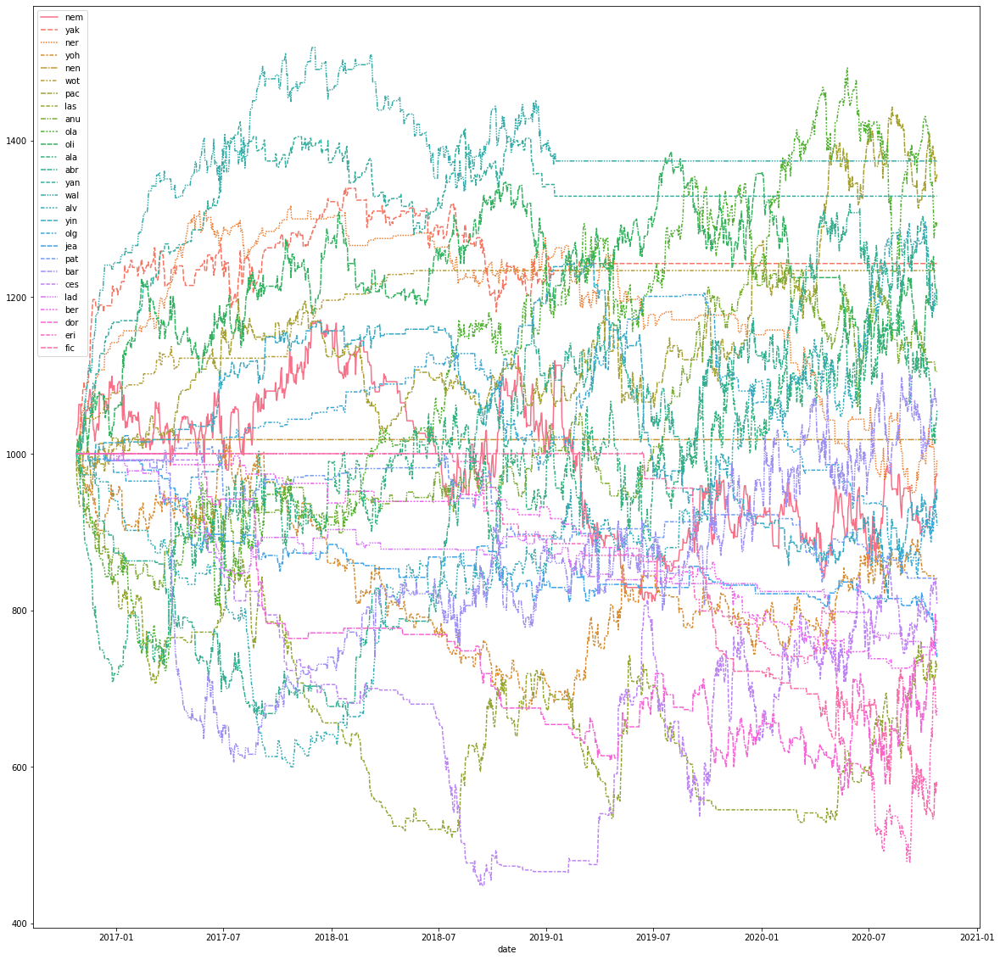

In [5]:
fig, ax = plt.subplots(figsize=(20, 20))
sns.lineplot(data=df_elo, ax=ax)
ax.legend()
plt.show()

## Behavioral data

In [6]:
data_path = os.path.join(SOURCE_FOLDER, "data_B.xlsx")
df_bhv = pd.read_excel(data_path, 
                   usecols=("monkey", "date", "choice", "stim_left_p", "stim_left_x0", "stim_right_p", 
                            "stim_right_x0", "time_response", 
                            "left_X", "left_Y", "right_X", "right_Y"))
df_bhv

,monkey,date,choice,stim_left_p,stim_left_x0,stim_right_p,stim_right_x0,time_response,left_X,left_Y,right_X,right_Y
0,Ola,2020-06-25None,0,0.75,2,0.75,3,528,1195.0,131.0,1195.0,517.0
1,Ola,2020-06-25None,0,0.50,3,0.25,3,506,1195.0,131.0,1195.0,517.0
2,Ola,2020-06-25None,0,0.75,2,0.75,-2,394,469.0,131.0,469.0,517.0
3,Ola,2020-06-25None,0,0.25,-2,0.25,-3,396,469.0,131.0,469.0,517.0
4,Ola,2020-06-25None,0,0.75,-1,0.75,-3,329,469.0,131.0,469.0,517.0
...,...,...,...,...,...,...,...,...,...,...,...,...
146420,Alv,2020-10-25None,0,0.25,-2,1.00,-1,1074,1195.0,131.0,1195.0,517.0
146421,Alv,2020-10-25None,0,1.00,-2,1.00,-3,1995,469.0,131.0,469.0,517.0
146422,Alv,2020-10-25None,1,0.25,3,0.75,2,843,1195.0,131.0,1195.0,517.0
146423,Alv,2020-10-25None,0,1.00,1,0.25,1,703,469.0,131.0,469.0,517.0


In [7]:
df_bhv.dropna(axis=0, inplace=True)
df_bhv

,monkey,date,choice,stim_left_p,stim_left_x0,stim_right_p,stim_right_x0,time_response,left_X,left_Y,right_X,right_Y
0,Ola,2020-06-25None,0,0.75,2,0.75,3,528,1195.0,131.0,1195.0,517.0
1,Ola,2020-06-25None,0,0.50,3,0.25,3,506,1195.0,131.0,1195.0,517.0
2,Ola,2020-06-25None,0,0.75,2,0.75,-2,394,469.0,131.0,469.0,517.0
3,Ola,2020-06-25None,0,0.25,-2,0.25,-3,396,469.0,131.0,469.0,517.0
4,Ola,2020-06-25None,0,0.75,-1,0.75,-3,329,469.0,131.0,469.0,517.0
...,...,...,...,...,...,...,...,...,...,...,...,...
146420,Alv,2020-10-25None,0,0.25,-2,1.00,-1,1074,1195.0,131.0,1195.0,517.0
146421,Alv,2020-10-25None,0,1.00,-2,1.00,-3,1995,469.0,131.0,469.0,517.0
146422,Alv,2020-10-25None,1,0.25,3,0.75,2,843,1195.0,131.0,1195.0,517.0
146423,Alv,2020-10-25None,0,1.00,1,0.25,1,703,469.0,131.0,469.0,517.0


Format the dates

In [8]:
df_bhv.date = df_bhv.date.apply(lambda element: element.replace("None", ""))
df_bhv.date = pd.to_datetime(df_bhv.date)
df_bhv

,monkey,date,choice,stim_left_p,stim_left_x0,stim_right_p,stim_right_x0,time_response,left_X,left_Y,right_X,right_Y
0,Ola,2020-06-25,0,0.75,2,0.75,3,528,1195.0,131.0,1195.0,517.0
1,Ola,2020-06-25,0,0.50,3,0.25,3,506,1195.0,131.0,1195.0,517.0
2,Ola,2020-06-25,0,0.75,2,0.75,-2,394,469.0,131.0,469.0,517.0
3,Ola,2020-06-25,0,0.25,-2,0.25,-3,396,469.0,131.0,469.0,517.0
4,Ola,2020-06-25,0,0.75,-1,0.75,-3,329,469.0,131.0,469.0,517.0
...,...,...,...,...,...,...,...,...,...,...,...,...
146420,Alv,2020-10-25,0,0.25,-2,1.00,-1,1074,1195.0,131.0,1195.0,517.0
146421,Alv,2020-10-25,0,1.00,-2,1.00,-3,1995,469.0,131.0,469.0,517.0
146422,Alv,2020-10-25,1,0.25,3,0.75,2,843,1195.0,131.0,1195.0,517.0
146423,Alv,2020-10-25,0,1.00,1,0.25,1,703,469.0,131.0,469.0,517.0


Rename the columns

In [9]:
new = {"choice": "c"}
for (var, new_var) in (("p", "p"), ("x0", "x")):
    for (side, new_side) in (("left", "0"), ("right", "1")):
        new.update({f'stim_{side}_{var}': f'{new_var}{new_side}'})
df_bhv.rename(columns=new, inplace=True)
df_bhv

,monkey,date,c,p0,x0,p1,x1,time_response,left_X,left_Y,right_X,right_Y
0,Ola,2020-06-25,0,0.75,2,0.75,3,528,1195.0,131.0,1195.0,517.0
1,Ola,2020-06-25,0,0.50,3,0.25,3,506,1195.0,131.0,1195.0,517.0
2,Ola,2020-06-25,0,0.75,2,0.75,-2,394,469.0,131.0,469.0,517.0
3,Ola,2020-06-25,0,0.25,-2,0.25,-3,396,469.0,131.0,469.0,517.0
4,Ola,2020-06-25,0,0.75,-1,0.75,-3,329,469.0,131.0,469.0,517.0
...,...,...,...,...,...,...,...,...,...,...,...,...
146420,Alv,2020-10-25,0,0.25,-2,1.00,-1,1074,1195.0,131.0,1195.0,517.0
146421,Alv,2020-10-25,0,1.00,-2,1.00,-3,1995,469.0,131.0,469.0,517.0
146422,Alv,2020-10-25,1,0.25,3,0.75,2,843,1195.0,131.0,1195.0,517.0
146423,Alv,2020-10-25,0,1.00,1,0.25,1,703,469.0,131.0,469.0,517.0


(0, 0) : top left corner
469 left
1195: right
131: top
517: bottom
line 2: "left": left, top, "right": left, bottom

Set the type of trial for each line

In [10]:
lottery_types = {}

new_cols = (
    "is_gain", "is_loss", "is_gain_vs_loss", 
    "is_risky_left", "is_risky_right", 
    "is_same_p", "is_same_x", 
    "is_best_left", "is_best_right",
    "pair_id",
    "is_control", "is_risky", "is_neither_risky_nor_control",
    "is_reversed",
    "choose_risky", "choose_best")
new_content = {k: [] for k in new_cols}

for i, e in tqdm(df_bhv.iterrows(), file=sys.stdout, total=len(df_bhv)):
    e.is_gain = e.x0 >= 0 and e.x1 >= 0
    e.is_loss = e.x0 <= 0 and e.x1 <= 0
    e.is_gain_vs_loss = not (e.is_gain or e.is_loss)

    e.is_risky_left = not e.is_gain_vs_loss and \
        np.abs(e.x0) > np.abs(e.x1) and e.p0 < e.p1
    e.is_risky_right = not e.is_gain_vs_loss and \
        np.abs(e.x0) < np.abs(e.x1) and e.p0 > e.p1

    e.is_risky = e.is_risky_left or e.is_risky_right

    e.is_same_p = e.p0 == e.p1
    e.is_same_x = e.x0 == e.x1
    e.is_best_left = \
        (e.x0 > e.x1 and e.is_same_p) \
        or (e.p0 > e.p1 and e.is_same_x and e.is_gain) \
        or (e.p0 < e.p1 and e.is_same_x and e.is_loss) \
        or (e.is_gain_vs_loss)
    e.is_best_right = \
        not e.is_risky and not e.is_best_left

    e.is_control = e.is_best_left or e.is_best_right

    e.is_neither_risky_nor_control = not (e.is_control or e.is_risky)
    
    if not e.is_neither_risky_nor_control:

        if (e.is_risky and e.is_risky_left) or (e.is_control and e.is_best_left):
            pair = (e.p0, e.x0, e.p1, e.x1)
            e.is_reversed = False
        else:
            pair = (e.p1, e.x1, e.p0, e.x0)
            e.is_reversed = True
        try:
            e.pair_id = lottery_types[pair]
        except KeyError:
            e.pair_id = len(lottery_types)
            lottery_types[pair] = e.pair_id
        
        e.choose_best = (e.is_best_left and e.c == 0) or (e.is_best_right and e.c == 1)
        e.choose_risky = (e.is_risky_left and e.c == 0) or (e.is_risky_right and e.c == 1)
        
    else:
        e.pair_id = -1
        e.is_reversed = False
        e.choose_best = False
        e.choose_risky = False

    for k in new_cols:
        v = getattr(e, k)
        new_content[k].append(v)

for k in new_cols:
    df_bhv[k] = new_content[k]

100%|██████████| 137297/137297 [00:49<00:00, 2763.49it/s]


In [11]:
df_bhv

,monkey,date,c,p0,x0,p1,x1,time_response,left_X,left_Y,...,is_same_x,is_best_left,is_best_right,pair_id,is_control,is_risky,is_neither_risky_nor_control,is_reversed,choose_risky,choose_best
0,Ola,2020-06-25,0,0.75,2,0.75,3,528,1195.0,131.0,...,False,False,True,0,True,False,False,True,False,False
1,Ola,2020-06-25,0,0.50,3,0.25,3,506,1195.0,131.0,...,True,True,False,1,True,False,False,False,False,True
2,Ola,2020-06-25,0,0.75,2,0.75,-2,394,469.0,131.0,...,False,True,False,2,True,False,False,False,False,True
3,Ola,2020-06-25,0,0.25,-2,0.25,-3,396,469.0,131.0,...,False,True,False,3,True,False,False,False,False,True
4,Ola,2020-06-25,0,0.75,-1,0.75,-3,329,469.0,131.0,...,False,True,False,4,True,False,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146420,Alv,2020-10-25,0,0.25,-2,1.00,-1,1074,1195.0,131.0,...,False,False,False,83,False,True,False,False,True,False
146421,Alv,2020-10-25,0,1.00,-2,1.00,-3,1995,469.0,131.0,...,False,True,False,30,True,False,False,False,False,True
146422,Alv,2020-10-25,1,0.25,3,0.75,2,843,1195.0,131.0,...,False,False,False,9,False,True,False,False,False,False
146423,Alv,2020-10-25,0,1.00,1,0.25,1,703,469.0,131.0,...,True,True,False,17,True,False,False,False,False,True


In [12]:
df_bhv.to_csv(os.path.join(BACKUP_FOLDER, "df_bhv.csv"), index=False)

# Import formated data

In [13]:
df_bhv = pd.read_csv(os.path.join(BACKUP_FOLDER, "df_bhv.csv"))
df_bhv.date = pd.to_datetime(df_bhv.date)
df_bhv

,monkey,date,c,p0,x0,p1,x1,time_response,left_X,left_Y,...,is_same_x,is_best_left,is_best_right,pair_id,is_control,is_risky,is_neither_risky_nor_control,is_reversed,choose_risky,choose_best
0,Ola,2020-06-25,0,0.75,2,0.75,3,528,1195.0,131.0,...,False,False,True,0,True,False,False,True,False,False
1,Ola,2020-06-25,0,0.50,3,0.25,3,506,1195.0,131.0,...,True,True,False,1,True,False,False,False,False,True
2,Ola,2020-06-25,0,0.75,2,0.75,-2,394,469.0,131.0,...,False,True,False,2,True,False,False,False,False,True
3,Ola,2020-06-25,0,0.25,-2,0.25,-3,396,469.0,131.0,...,False,True,False,3,True,False,False,False,False,True
4,Ola,2020-06-25,0,0.75,-1,0.75,-3,329,469.0,131.0,...,False,True,False,4,True,False,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
137292,Alv,2020-10-25,0,0.25,-2,1.00,-1,1074,1195.0,131.0,...,False,False,False,83,False,True,False,False,True,False
137293,Alv,2020-10-25,0,1.00,-2,1.00,-3,1995,469.0,131.0,...,False,True,False,30,True,False,False,False,False,True
137294,Alv,2020-10-25,1,0.25,3,0.75,2,843,1195.0,131.0,...,False,False,False,9,False,True,False,False,False,False
137295,Alv,2020-10-25,0,1.00,1,0.25,1,703,469.0,131.0,...,True,True,False,17,True,False,False,False,False,True


# Counts

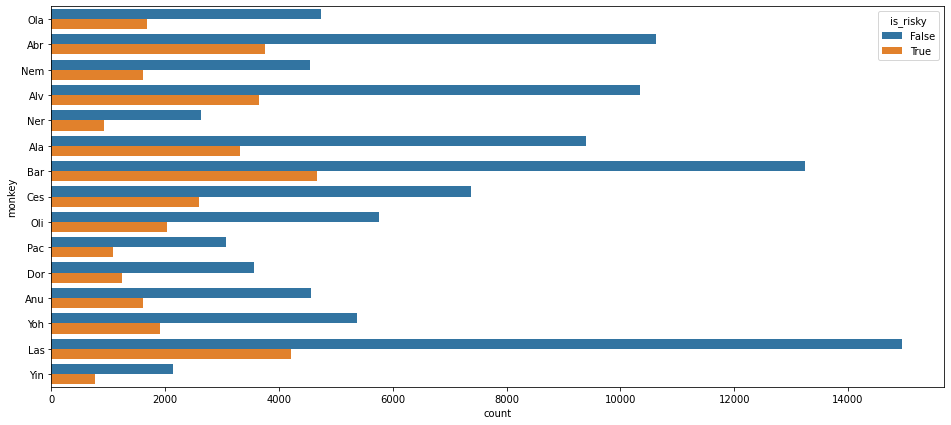

In [14]:
fig, ax = plt.subplots(figsize=(16, 7))
sns.countplot(y="monkey", hue="is_risky", data=df_bhv, ax=ax)
plt.show()

# Fit

## Optimization technique

In [15]:
EPS = np.finfo(float).eps

def objective(param, model, data):
    # Since we will look for the minimum, 
    # let's return -LLS instead of LLS

    inst = model(param=param)

    n = len(data)
    ll = np.zeros(n)

    for i, (_, row) in enumerate(data.iterrows()):
        pi = inst.p_choice(**row)
        ll[i] = np.log(pi + EPS)

    return -ll.sum()

def optimize(model, data):

    # Define an init guess
    init_guess = [(b[1] - b[0])/2 for b in model.fit_bounds]

    # Run the optimizer
    res = scipy.optimize.minimize(
        fun=objective,
        x0=init_guess,
        bounds=model.fit_bounds,
        args=(model, data))

    # Make sure that the optimizer ended up with success
    assert res.success

    # Get the best param and best value from the 
    best_param = res.x
    best_value = res.fun

    return best_param, best_value

## Decision-making model

In [123]:
class Model:
    
    param_labels = ['distortion', 'precision', 'risk_aversion']
    fit_bounds = [(0.2, 1.8), (0.1, 10.0), (-0.99, 0.99)]

    def __init__(self, param):
        self.distortion, self.precision, self.risk_aversion = param
    
    def p_choice(self, p0, x0, p1, x1, c, *args, **kwargs):

        p = self.p(p0=p0, x0=x0, p1=p1, x1=x1)
        return p[int(c)]

    @classmethod
    def softmax(cls, v, precision):
        return expit(v/precision)

    @staticmethod
    def u(x, risk_aversion):
        if isinstance(x, np.ndarray):
            raise Exception
        else:
            if x >= 0:
                return x ** (1-risk_aversion)
            else:
                return - np.abs(x) ** (1 + risk_aversion)
    
    @classmethod
    def pi(cls, p, alpha):
        if isinstance(p, np.ndarray):
            to_return = np.zeros(p.shape)
            unq_zero = p != 0
            to_return[unq_zero] = np.exp(-(-np.log(p)) ** alpha)
            return to_return
        else:
            if p == 0:
                return 0
            else:
                return np.exp(-(-np.log(p)) ** alpha)

    def p(self, p0, x0, p1, x1):

        v0 = self.pi(p0, self.distortion) * self.u(x0, self.risk_aversion)
        v1 = self.pi(p1, self.distortion) * self.u(x1, self.risk_aversion)
        p = np.zeros(2)
        p[0] = self.softmax(v0-v1, self.precision)
        p[1] = 1 - p[0]
        return p

## Trial with Bar

In [17]:
m = "Bar"
cd = "gain" 

# Select the date
df_m = df_bhv[(df_bhv.monkey == m) & (df_bhv.is_risky == True) & (df_bhv[f"is_{cd}"] == True)]

# Drop columns with identical values
nunique = df_m.apply(pd.Series.nunique)
cols_to_drop = nunique[nunique == 1].index
df_m.drop(cols_to_drop, axis=1)

df_m

,monkey,date,c,p0,x0,p1,x1,time_response,left_X,left_Y,...,is_same_x,is_best_left,is_best_right,pair_id,is_control,is_risky,is_neither_risky_nor_control,is_reversed,choose_risky,choose_best
618,Bar,2020-06-25,1,0.25,3,0.75,1,666,1195.0,131.0,...,False,False,False,88,False,True,False,False,False,False
628,Bar,2020-06-25,1,0.25,3,0.50,2,655,1195.0,131.0,...,False,False,False,43,False,True,False,False,False,False
642,Bar,2020-06-25,1,1.00,1,0.75,3,845,1195.0,131.0,...,False,False,False,15,False,True,False,True,True,False
672,Bar,2020-06-25,1,0.50,3,0.75,2,1374,469.0,131.0,...,False,False,False,81,False,True,False,False,False,False
697,Bar,2020-06-25,1,0.75,1,0.50,2,1094,469.0,131.0,...,False,False,False,12,False,True,False,True,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
137103,Bar,2020-10-25,1,1.00,1,0.50,2,584,469.0,131.0,...,False,False,False,29,False,True,False,True,True,False
137117,Bar,2020-10-25,1,1.00,1,0.25,2,635,469.0,131.0,...,False,False,False,99,False,True,False,True,True,False
137122,Bar,2020-10-25,0,0.50,3,0.75,1,701,469.0,131.0,...,False,False,False,23,False,True,False,False,True,False
137127,Bar,2020-10-25,1,0.25,3,0.50,1,577,1195.0,131.0,...,False,False,False,95,False,True,False,False,False,False


Fit all the data at once...

In [18]:
best_param, best_value = optimize(model=Model, data=df_m)
print("best_param", best_param)

best_param [ 0.72158801  0.72756233 -0.20691704]


Fit the data day by day...

In [21]:
dates = df_m.date.unique()
n_days = len(dates)
n_param = len(Model.param_labels)

r = np.zeros((n_days, n_param))
n_trial = np.zeros(n_days, dtype=int)
for i in tqdm(range(n_days), file=sys.stdout):
    slide = df_m.date == dates[i]
    n_trial[i] = np.sum(slide)
    best_param, best_value = optimize(model=Model, data=df_m[slide])
    r[i] = best_param

df_p = pd.DataFrame(r, index=dates, columns=Model.param_labels)
df_p["n"] = n_trial
df_p

100%|██████████| 113/113 [00:59<00:00,  1.91it/s]


,distortion,precision,risk_aversion,n
2020-06-25,0.831553,1.281043,-0.295716,115
2020-06-26,0.930450,1.079990,-0.067519,138
2020-06-27,0.869438,0.615553,0.111349,116
2020-06-28,0.935447,0.585639,-0.097054,118
2020-06-29,0.744479,0.490433,-0.255992,130
...,...,...,...,...
2020-10-21,0.618826,0.223102,0.466522,14
2020-10-22,0.606719,0.100000,-0.135914,12
2020-10-23,1.261552,0.100000,-0.289819,12
2020-10-24,0.309839,0.251927,0.398676,6


Select the corresponding Elo data 

In [22]:
df_elo_m = df_elo[m.lower()]
df_elo_m = df_elo_m[df_elo_m.index >= min(dates)]
df_elo_m

date
2020-06-25     999
2020-06-26     991
2020-06-27     977
2020-06-28     948
2020-06-29     966
              ... 
2020-10-21    1083
2020-10-22    1070
2020-10-23    1072
2020-10-24    1062
2020-10-25    1062
Name: bar, Length: 123, dtype: int64

### Plot

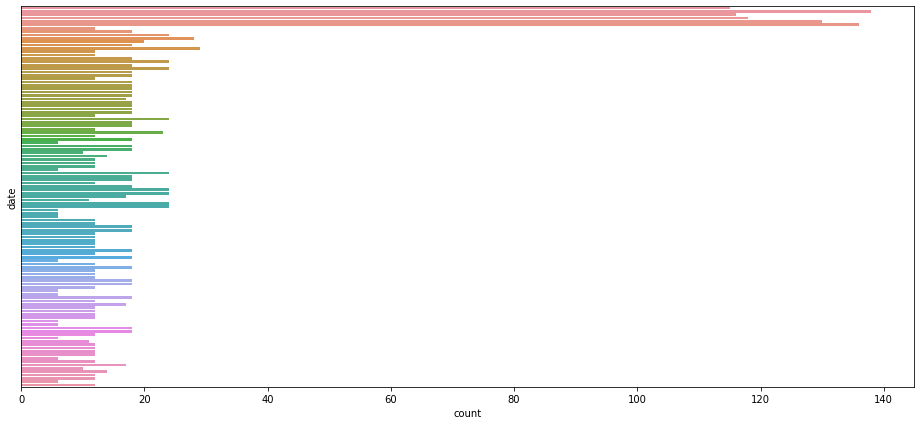

In [23]:
fig, ax = plt.subplots(figsize=(16, 7))
sns.countplot(y="date", data=df_m, ax=ax)
ax.set_yticks([])
plt.show()

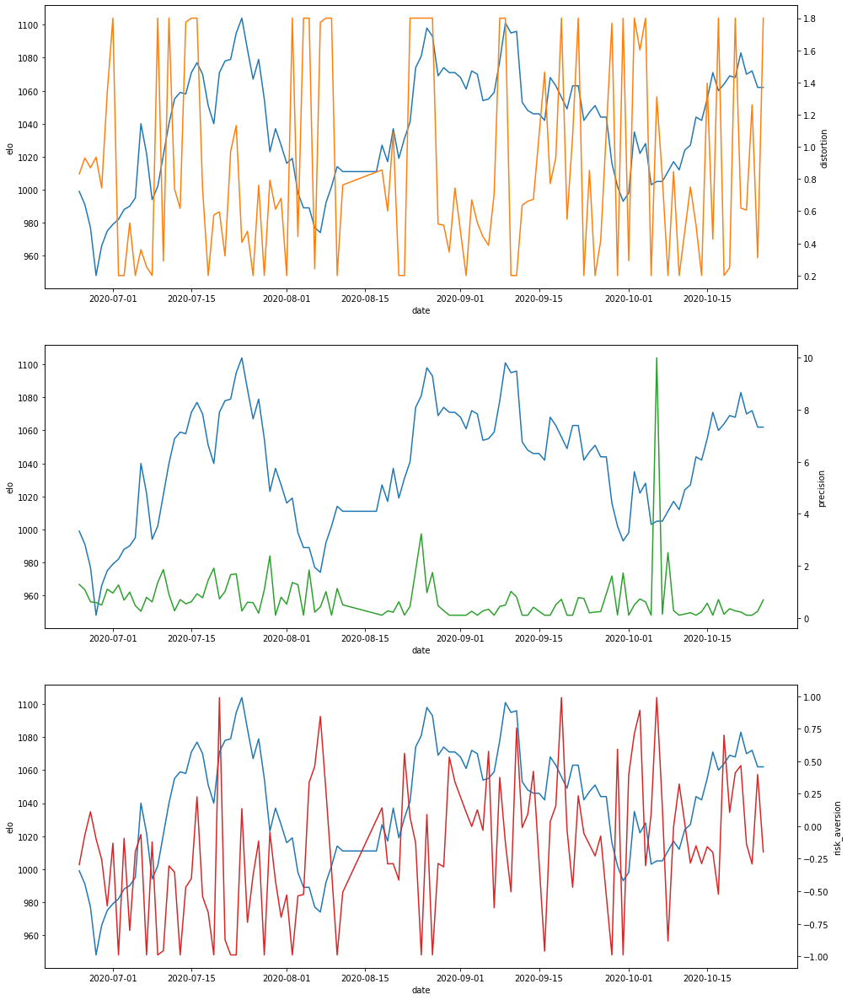

In [24]:
fig, axes = plt.subplots(figsize=(16, 7*n_param), nrows=n_param)
colors = [f"C{i}" for i in range(1, n_param+1)]
for i in range(n_param):
    
    ax = axes[i]
    param= Model.param_labels[i]
    color = colors[i]
    
    sns.lineplot(data=df_elo_m, ax=ax)
    ax.set_ylabel("elo")
    ax_tw = ax.twinx()
    sns.lineplot(x=dates, y=param, data=df_p, ax=ax_tw, color=color)

plt.show()

## Day by day: With all the monkeys...

### Get the data

In [25]:
df_fit_day = pd.DataFrame()

cond = ("is_gain", "is_loss")
monkeys = df_bhv.monkey.unique()

for i_m, m in enumerate(monkeys):

    print(f"monkey {i_m+1}/{len(monkeys)}")

    for cd in cond:
        
        # Select the data
        df_m = df_bhv[(df_bhv.monkey == m) & (df_bhv.is_risky == True) & (df_bhv[cd] == True)]
        
        # Get the dates
        dates = df_m.date.unique()
        n_days = len(dates)
        
        # Get the number of parameters
        n_param = len(Model.param_labels)
        
        # Optimize for each day separately
        r = np.zeros((n_days, n_param))
        n_trial = np.zeros(n_days, dtype=int)
        for i in tqdm(range(n_days), file=sys.stdout):
            slide = df_m.date == dates[i]
            n_trial[i] = np.sum(slide)
            best_param, best_value = optimize(model=Model, data=df_m[slide])
            r[i] = best_param
        
        # Backup
        df_m_cd = pd.DataFrame(r, columns=Model.param_labels)
        df_m_cd["date"] = dates
        df_m_cd["monkey"] = m
        df_m_cd["condition"] = cd.replace("is_", "")
        df_m_cd["n"] = n_trial
        df_fit_day = pd.concat((df_fit_day, df_m_cd))

df_fit_day.to_csv(os.path.join(BACKUP_FOLDER, "df_fit_day.csv"), index=False)

monkey 1/15
100%|██████████| 86/86 [00:17<00:00,  5.01it/s]
monkey 2/15
100%|██████████| 103/103 [00:53<00:00,  1.92it/s]
monkey 3/15
100%|██████████| 60/60 [00:25<00:00,  2.40it/s]
monkey 4/15
100%|██████████| 113/113 [00:53<00:00,  2.12it/s]
monkey 5/15
100%|██████████| 66/66 [00:10<00:00,  6.52it/s]
monkey 6/15
100%|██████████| 111/111 [00:47<00:00,  2.35it/s]
monkey 7/15
100%|██████████| 113/113 [01:11<00:00,  1.57it/s]
monkey 8/15
100%|██████████| 106/106 [00:37<00:00,  2.79it/s]
monkey 9/15
100%|██████████| 98/98 [00:28<00:00,  3.47it/s]
monkey 10/15
100%|██████████| 73/73 [00:13<00:00,  5.41it/s]
monkey 11/15
100%|██████████| 89/89 [00:16<00:00,  5.54it/s]
monkey 12/15
100%|██████████| 80/80 [00:22<00:00,  3.55it/s]
monkey 13/15
100%|██████████| 70/70 [00:24<00:00,  2.87it/s]
monkey 14/15
100%|██████████| 78/78 [00:45<00:00,  1.70it/s]
monkey 15/15
100%|██████████| 62/62 [00:07<00:00,  7.78it/s]


### Plot

In [26]:
df_fit_day = pd.read_csv(os.path.join(BACKUP_FOLDER, "df_fit_day.csv"))
df_fit_day.date = pd.to_datetime(df_fit_day.date)
df_fit_day

,distortion,precision,risk_aversion,date,monkey,condition,n
0,0.200000,10.000000,0.990000,2020-06-25,Ola,gain,46
1,1.800000,2.298505,0.095405,2020-06-26,Ola,gain,13
2,1.800000,0.641667,0.929759,2020-06-27,Ola,gain,18
3,0.200000,0.487869,0.004734,2020-06-28,Ola,gain,12
4,1.192238,0.917417,-0.192953,2020-06-29,Ola,gain,23
...,...,...,...,...,...,...,...
2607,0.200000,10.000000,0.990000,2020-10-20,Yin,loss,3
2608,0.200000,1.038210,-0.879448,2020-10-21,Yin,loss,6
2609,0.784174,0.100000,-0.990000,2020-10-22,Yin,loss,6
2610,1.800000,1.078414,0.873188,2020-10-24,Yin,loss,6


In [27]:
df_elo = pd.read_csv(os.path.join(BACKUP_FOLDER, "df_elo.csv"), index_col=0)
df_elo.index = pd.to_datetime(df_elo.index)
df_elo

,nem,yak,ner,yoh,nen,wot,pac,las,anu,ola,...,olg,jea,pat,bar,ces,lad,ber,dor,eri,fic
date,,,,,,,,,,,,,,,,,,,,,
2016-10-25,1024,1009,1018,984,991,1010,991,982,991,1000,...,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000
2016-10-26,1032,1009,1018,1003,991,1010,982,964,991,999,...,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000
2016-10-27,1032,1009,1018,1003,991,1010,982,956,991,999,...,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000
2016-10-28,1041,1009,1018,1003,991,1010,982,956,991,999,...,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000
2016-10-29,1063,1009,1018,1011,991,1010,975,941,984,1008,...,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-10-21,938,1243,961,840,1018,1234,1379,713,1117,1287,...,933,760,841,1083,837,753,743,766,702,579
2020-10-22,970,1243,962,840,1018,1234,1347,716,1105,1296,...,935,755,841,1070,832,753,743,795,702,566
2020-10-23,971,1243,970,840,1018,1234,1347,735,1105,1296,...,920,751,841,1072,838,753,758,773,668,566


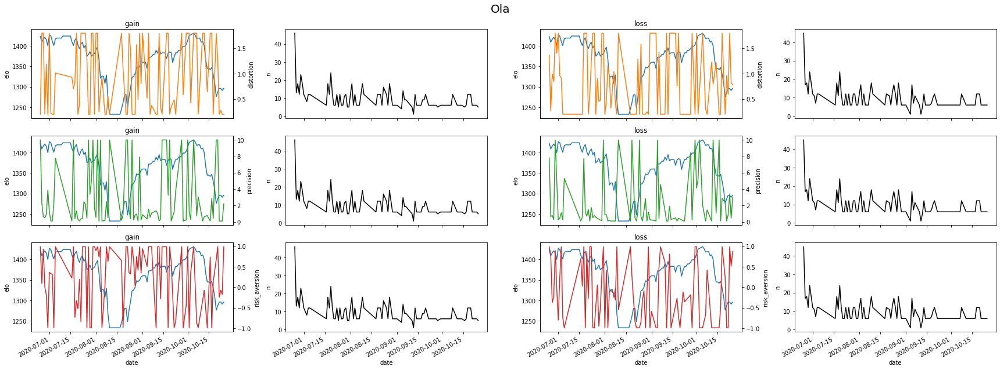

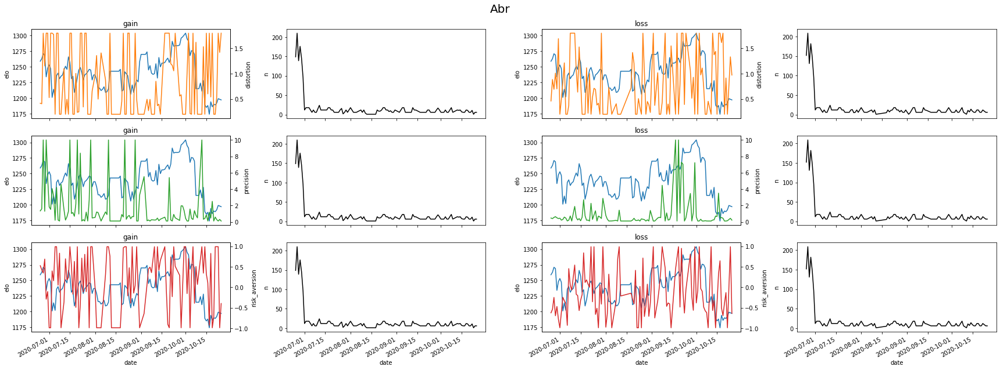

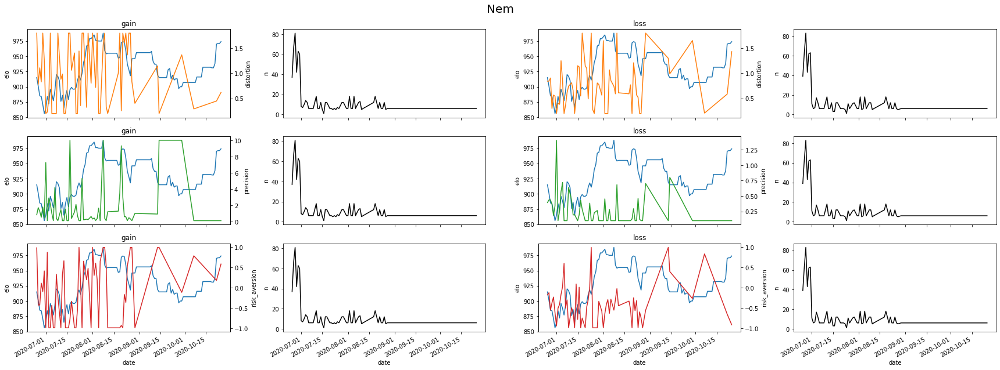

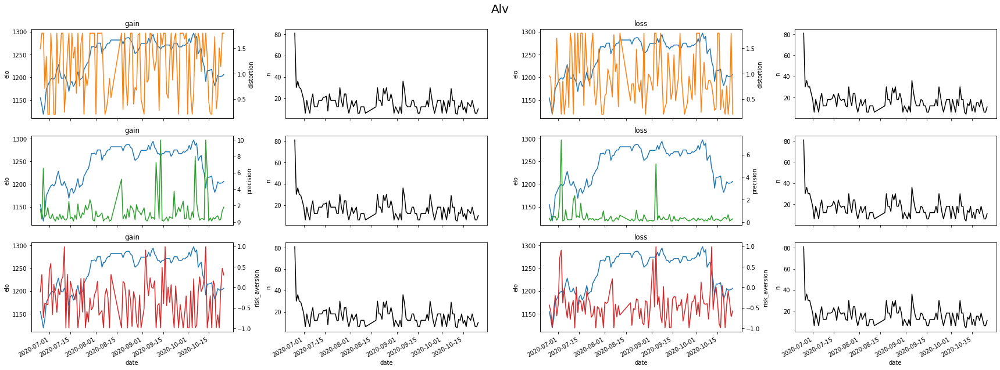

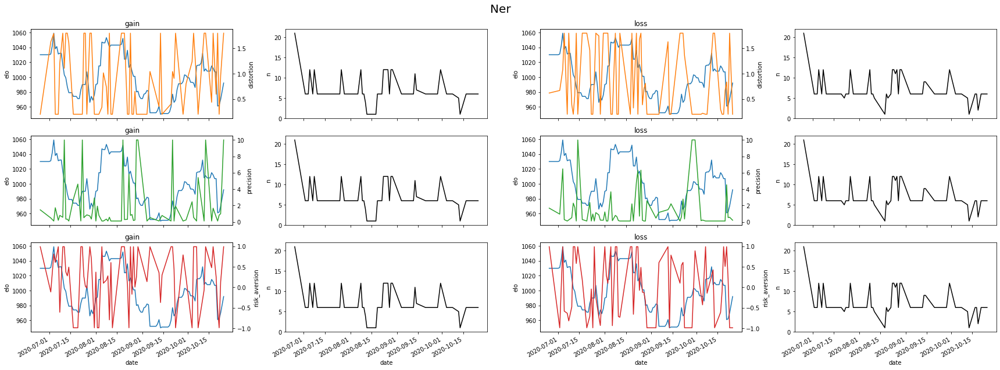

...

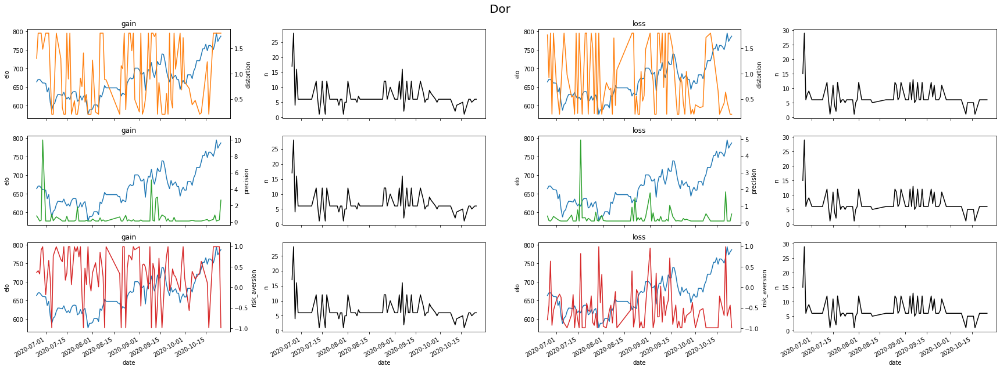

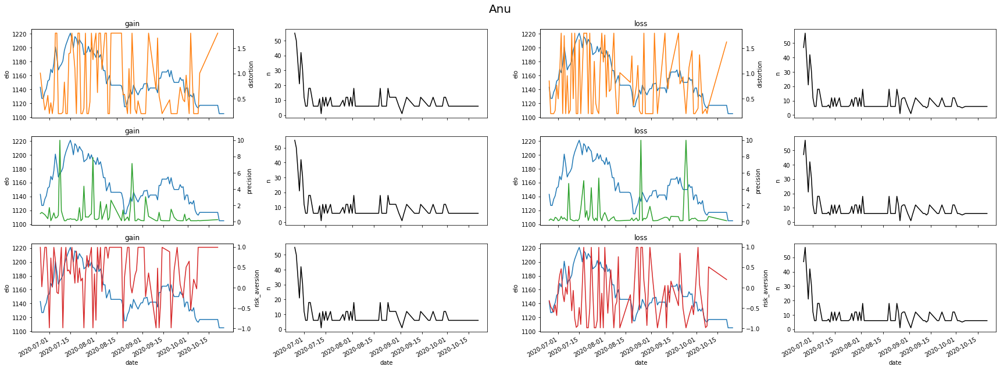

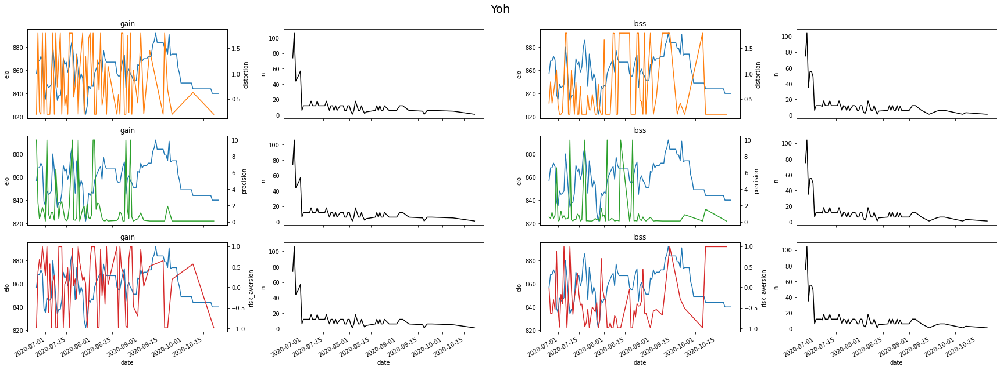

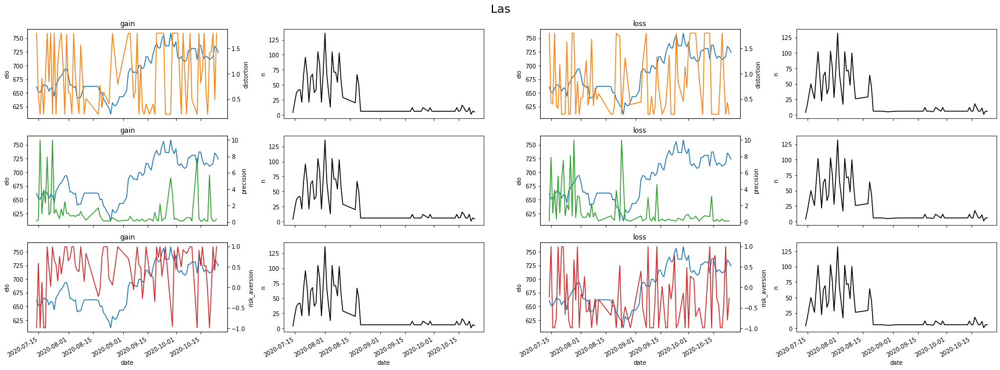

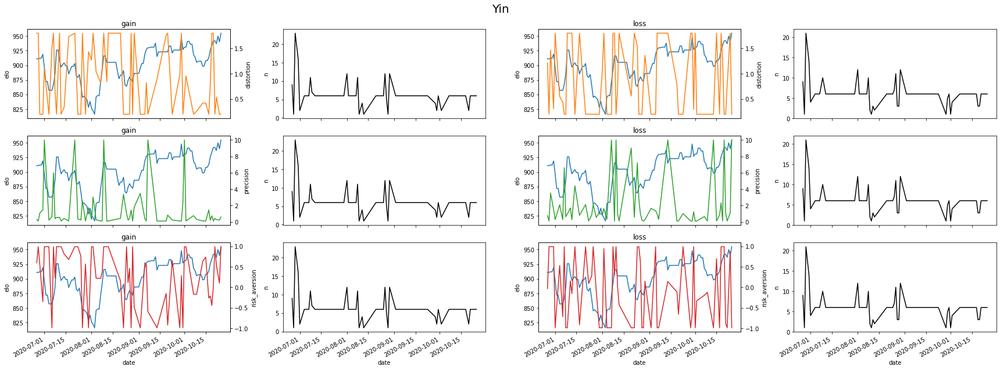

In [48]:
cond = df_fit_day.condition.unique()
n_param = len(Model.param_labels)
n_rows = n_param
n_cols = len(cond)*2

for i, m in enumerate(monkeys):
    
    fig, axes = plt.subplots(figsize=(6*n_cols, 3*n_rows), nrows=n_rows, ncols=n_cols)
    fig.suptitle(m, fontsize=20)
    colors = [f"C{k}" for k in range(1, n_param+1)]
    
    for j, cd in enumerate(cond):
        
        df_p = df_fit_day[(df_fit_day.monkey == m) & (df_fit_day.condition == cd)]
        
        df_elo_m = df_elo[m.lower()]
        df_elo_m = df_elo_m[df_elo_m.index >= min(df_p.date)]
        
        for k in range(n_param):

            ax = axes[k, j*2]
            ax.set_title(cd.replace("is_", ""))
            param = Model.param_labels[k]
            color = colors[k]

            sns.lineplot(data=df_elo_m, ax=ax)
            ax.set_ylabel("elo") 
            ax_tw = ax.twinx()
            sns.lineplot(x=df_p.date, y=param, data=df_p, ax=ax_tw, color=color)
            
            ax = axes[k, j*2 + 1]
            sns.lineplot(x=df_p.date, y="n", data=df_p, ax=ax, color='black')

    fig.autofmt_xdate()
    
    plt.tight_layout()
    plt.show()

## Using a sliding window: Trial with Bar

### Get the data

In [29]:
cd = "is_gain"
m = "Bar"

# Get the data
df_m = df_bhv[(df_bhv.monkey == m) & (df_bhv.is_risky == True) & (df_bhv[cd] == True)]

# Drop columns with identical values
nunique = df_m.apply(pd.Series.nunique)
cols_to_drop = nunique[nunique == 1].index
df_m.drop(cols_to_drop, axis=1)

# Get the dates
dates = df_m.date.unique()
n_days = len(dates)

In [33]:
n_param = len(Model.param_labels)
w = 5

r = np.zeros((n_days, n_param))
n_trial = np.zeros(n_days, dtype=int)
for i in tqdm(range(n_days), file=sys.stdout):
    
    # Apply mask for dates
    b0 = dates[max(i-(w-1), 0)]
    b1 = dates[min(i+w, n_days-1)]
    mask = (df_m.date >= b0) & (df_m.date <= b1)
    
    # Optimize
    best_param, best_value = optimize(model=Model, data=df_m[mask])
    r[i] = best_param
    
    # Count thre trials
    n_trial[i] = np.sum(mask)

df_m_cd = pd.DataFrame(r, index=dates, columns=Model.param_labels)
df_m_cd["n"] = n_trial
df_m_cd

100%|██████████| 113/113 [07:56<00:00,  4.22s/it]


,distortion,precision,risk_aversion,n
2020-06-25,0.928452,0.826746,-0.201538,753
2020-06-26,0.945851,0.838766,-0.204449,765
2020-06-27,0.933943,0.881863,-0.234254,783
2020-06-28,0.903873,0.885684,-0.234505,807
2020-06-29,0.884928,0.883117,-0.254085,835
...,...,...,...,...
2020-10-21,0.748084,0.365531,0.145037,101
2020-10-22,0.690840,0.336619,0.157052,95
2020-10-23,0.666158,0.348117,0.109329,83
2020-10-24,0.781546,0.350297,0.137144,66


In [34]:
df_elo_m = df_elo[m.lower()]
df_elo_m = df_elo_m[df_elo_m.index >= min(df_m_cd.index)]
df_elo_m

date
2020-06-25     999
2020-06-26     991
2020-06-27     977
2020-06-28     948
2020-06-29     966
              ... 
2020-10-21    1083
2020-10-22    1070
2020-10-23    1072
2020-10-24    1062
2020-10-25    1062
Name: bar, Length: 123, dtype: int64

### Plot

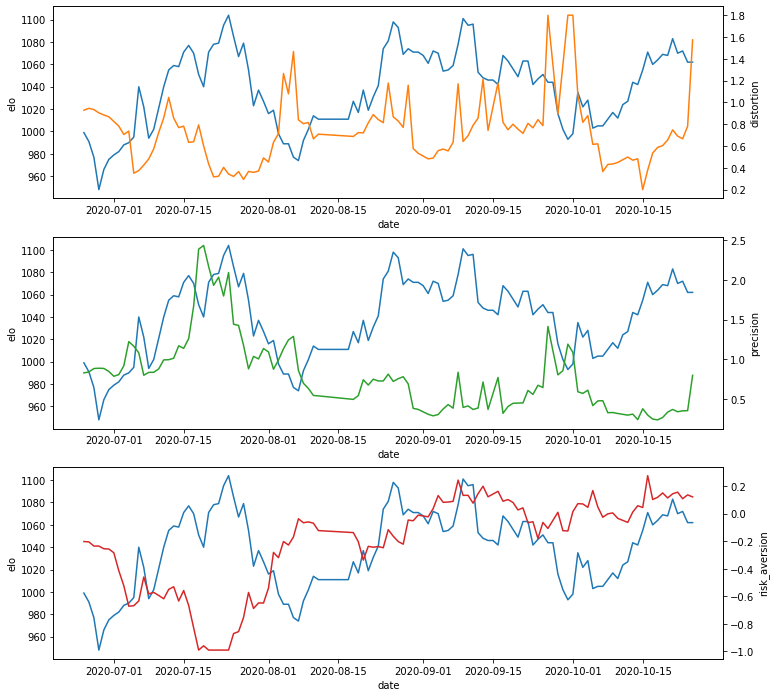

In [35]:
fig, axes = plt.subplots(figsize=(12, 4*n_param), nrows=n_param)
colors = [f"C{i}" for i in range(1, n_param+1)]
for i in range(n_param):
    
    ax = axes[i]
    param= Model.param_labels[i]
    color = colors[i]
    
    sns.lineplot(data=df_elo_m, ax=ax)
    ax.set_ylabel("elo")
    ax_tw = ax.twinx()
    sns.lineplot(x=df_m_cd.index, y=param, data=df_m_cd, ax=ax_tw, color=color)

plt.show()

## Using a slide window: With all the monkeys

### Get the data

In [36]:
df_fit = pd.DataFrame()

cond = ("is_gain", "is_loss")
w = 5

for i_m, m in enumerate(monkeys):

    print(f"monkey {i_m+1}/{len(monkeys)}")

    for cd in cond:
        
        # Get data
        df_m = df_bhv[(df_bhv.monkey == m) & (df_bhv.is_risky == True) & (df_bhv[cd] == True)]
        
        # Get dates
        dates = df_m.date.unique()
        n_days = len(dates)
        n_param = len(Model.param_labels)
        
        # Optimize for each 'windowed' day
        r = np.zeros((n_days, n_param))
        n_trial = np.zeros(n_days, dtype=int)
        for i in tqdm(range(n_days), file=sys.stdout):
            
            # Get the mask
            b0 = dates[max(i-(w-1), 0)]
            b1 = dates[min(i+w, n_days-1)]
            mask = (df_m.date >= b0) & (df_m.date <= b1)
            
            # Optimize
            best_param, best_value = optimize(model=Model, data=df_m[mask])
            r[i] = best_param
            
            # Count thre trials
            n_trial[i] = np.sum(mask)
        
        # Backup
        df_m_cd = pd.DataFrame(r, columns=Model.param_labels)
        df_m_cd["date"] = dates
        df_m_cd["monkey"] = m
        df_m_cd["condition"] = cd.replace("is_", "")
        df_m_cd["n"] = n_trial
        df_fit = pd.concat((df_fit, df_m_cd))

df_fit.to_csv(os.path.join(BACKUP_FOLDER, "df_fit.csv"))

monkey 1/15
100%|██████████| 86/86 [02:08<00:00,  1.50s/it]
monkey 2/15
100%|██████████| 103/103 [08:03<00:00,  4.69s/it]
monkey 3/15
100%|██████████| 60/60 [03:53<00:00,  3.88s/it]
monkey 4/15
100%|██████████| 113/113 [08:45<00:00,  4.65s/it]
monkey 5/15
100%|██████████| 66/66 [01:26<00:00,  1.31s/it]
monkey 6/15
100%|██████████| 111/111 [07:09<00:00,  3.87s/it]
monkey 7/15
100%|██████████| 113/113 [10:54<00:00,  5.79s/it]
monkey 8/15
100%|██████████| 106/106 [06:01<00:00,  3.41s/it]
monkey 9/15
100%|██████████| 98/98 [04:33<00:00,  2.79s/it]
monkey 10/15
100%|██████████| 73/73 [02:16<00:00,  1.86s/it]
monkey 11/15
100%|██████████| 89/89 [02:42<00:00,  1.83s/it]
monkey 12/15
100%|██████████| 80/80 [03:21<00:00,  2.52s/it]
monkey 13/15
100%|██████████| 70/70 [03:42<00:00,  3.18s/it]
monkey 14/15
100%|██████████| 78/78 [07:47<00:00,  5.99s/it]
monkey 15/15
100%|██████████| 62/62 [00:46<00:00,  1.32it/s]


### Plot

In [37]:
df_fit = pd.read_csv(os.path.join(BACKUP_FOLDER, "df_fit.csv"))
df_fit.date = pd.to_datetime(df_fit.date)
df_fit

,Unnamed: 0,distortion,precision,risk_aversion,date,monkey,condition,n
0,0,0.200000,10.000000,-0.552074,2020-06-25,Ola,gain,130
1,1,0.200000,10.000000,-0.512254,2020-06-26,Ola,gain,142
2,2,0.200000,2.727403,0.439623,2020-06-27,Ola,gain,152
3,3,0.200000,2.122734,0.514584,2020-06-28,Ola,gain,160
4,4,0.200000,2.723621,0.321982,2020-06-29,Ola,gain,172
...,...,...,...,...,...,...,...,...
2607,57,1.343875,7.899244,0.990000,2020-10-20,Yin,loss,48
2608,58,1.278380,9.770808,0.990000,2020-10-21,Yin,loss,42
2609,59,1.353748,5.161971,0.990000,2020-10-22,Yin,loss,36
2610,60,0.940235,6.624522,0.990000,2020-10-24,Yin,loss,30


In [38]:
df_elo = pd.read_csv(os.path.join(BACKUP_FOLDER, "df_elo.csv"), index_col=0)
df_elo.index = pd.to_datetime(df_elo.index)
df_elo

,nem,yak,ner,yoh,nen,wot,pac,las,anu,ola,...,olg,jea,pat,bar,ces,lad,ber,dor,eri,fic
date,,,,,,,,,,,,,,,,,,,,,
2016-10-25,1024,1009,1018,984,991,1010,991,982,991,1000,...,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000
2016-10-26,1032,1009,1018,1003,991,1010,982,964,991,999,...,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000
2016-10-27,1032,1009,1018,1003,991,1010,982,956,991,999,...,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000
2016-10-28,1041,1009,1018,1003,991,1010,982,956,991,999,...,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000
2016-10-29,1063,1009,1018,1011,991,1010,975,941,984,1008,...,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-10-21,938,1243,961,840,1018,1234,1379,713,1117,1287,...,933,760,841,1083,837,753,743,766,702,579
2020-10-22,970,1243,962,840,1018,1234,1347,716,1105,1296,...,935,755,841,1070,832,753,743,795,702,566
2020-10-23,971,1243,970,840,1018,1234,1347,735,1105,1296,...,920,751,841,1072,838,753,758,773,668,566


### With automatic scaling for each plot

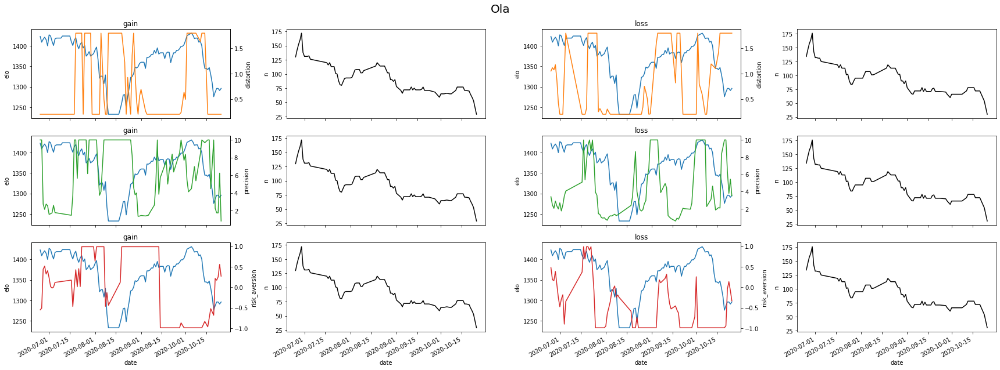

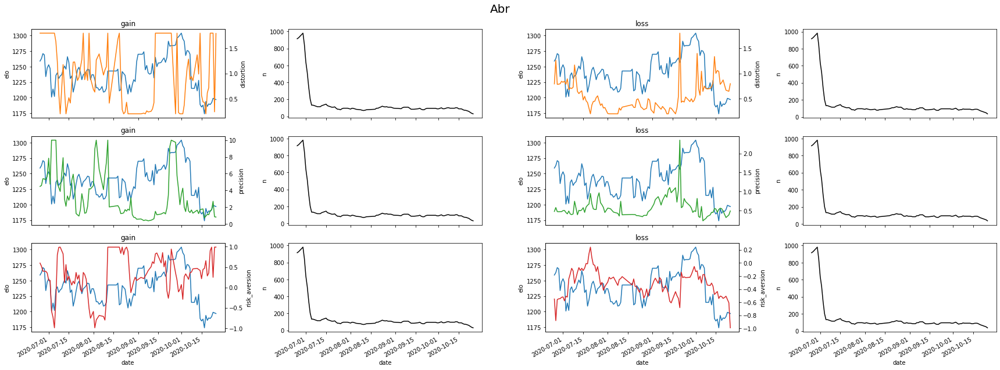

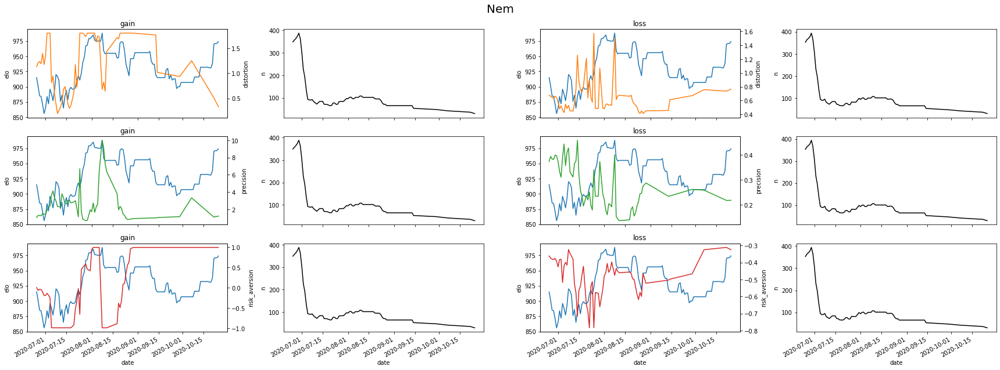

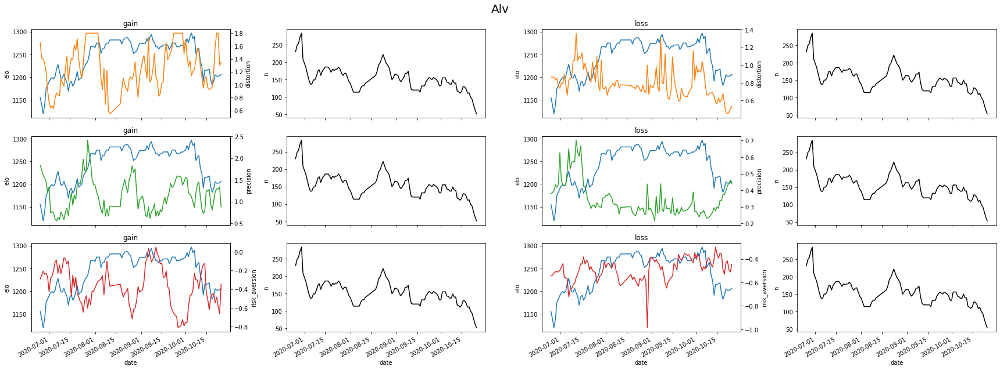

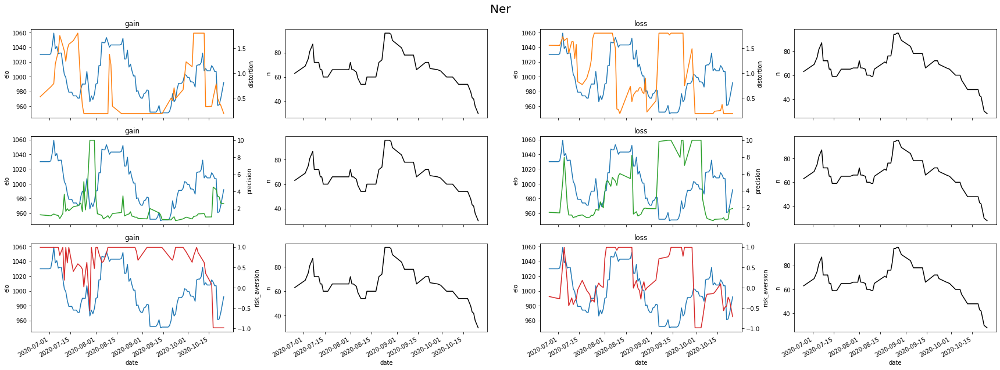

...

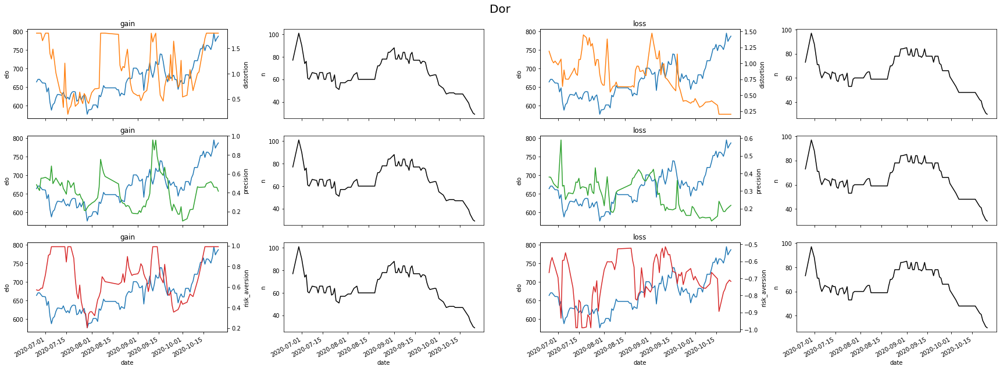

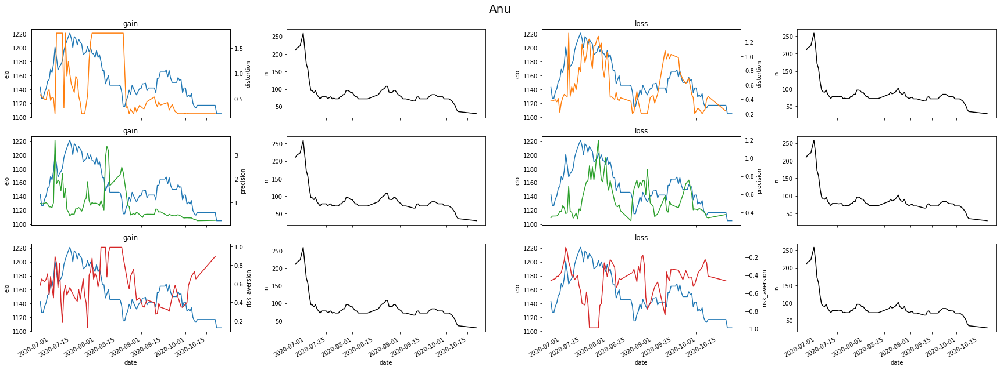

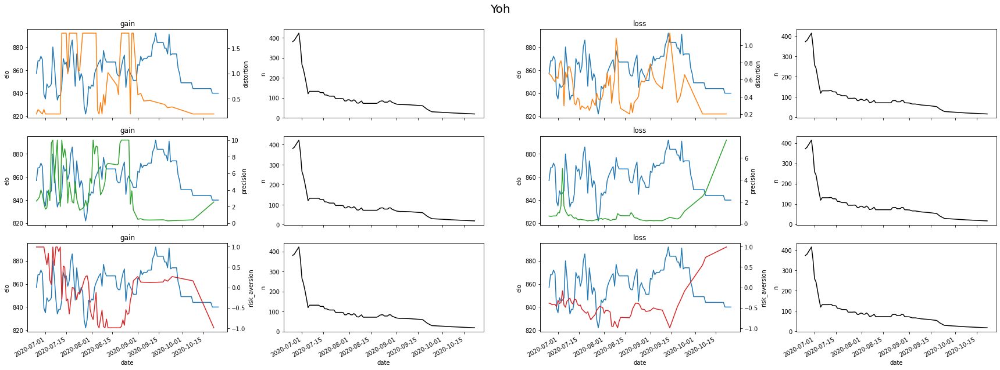

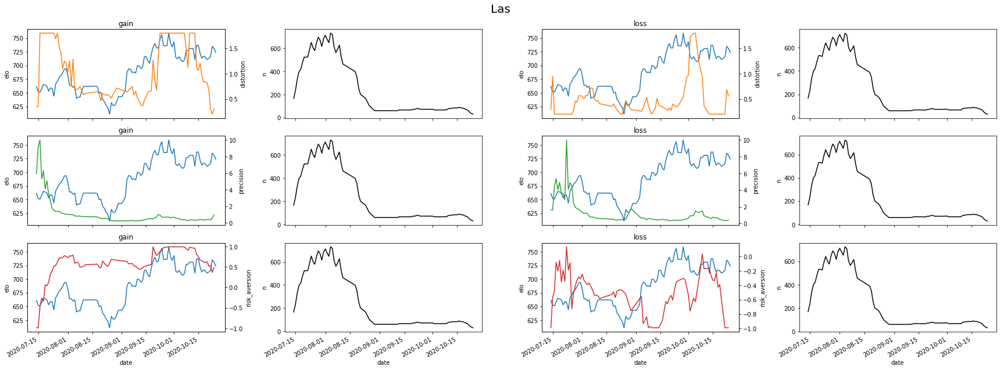

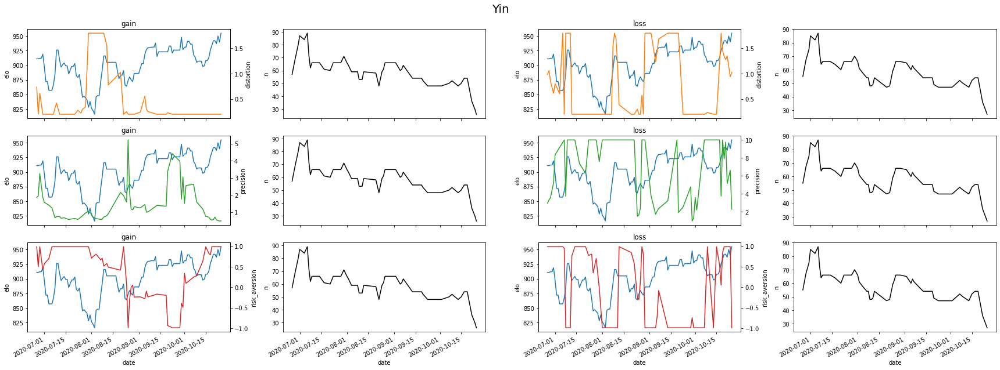

In [49]:
monkeys = df_fit.monkey.unique()
cond = df_fit.condition.unique()
n_param = len(Model.param_labels)
n_rows = n_param
n_cols = len(cond)*2

for i, m in enumerate(monkeys):
    
    fig, axes = plt.subplots(figsize=(6*n_cols, 3*n_rows), nrows=n_rows, ncols=n_cols)
    fig.suptitle(m, fontsize=20)
    colors = [f"C{k}" for k in range(1, n_param+1)]
    
    for j, cd in enumerate(cond):
        
        df_p = df_fit[(df_fit.monkey == m) & (df_fit.condition == cd)]
        
        df_elo_m = df_elo[m.lower()]
        df_elo_m = df_elo_m[df_elo_m.index >= min(df_p.date)]
        
        for k in range(n_param):

            ax = axes[k, j*2]
            ax.set_title(cd)
            param = Model.param_labels[k]
            # lim_param = Model.fit_bounds[k]
            color = colors[k]

            sns.lineplot(data=df_elo_m, ax=ax)
            ax.set_ylabel("elo")
            # ax.set_ylim(min_elo, max_elo)
            
            ax_tw = ax.twinx()
            # ax_tw.set_ylim(lim_param)
            sns.lineplot(x="date", y=param, data=df_p, ax=ax_tw, color=color)
            
            ax = axes[k, j*2 + 1]
            sns.lineplot(x=df_p.date, y="n", data=df_p, ax=ax, color='black')
    
    fig.autofmt_xdate()
    
    plt.tight_layout()
    plt.show()

### With 'min max' scaling

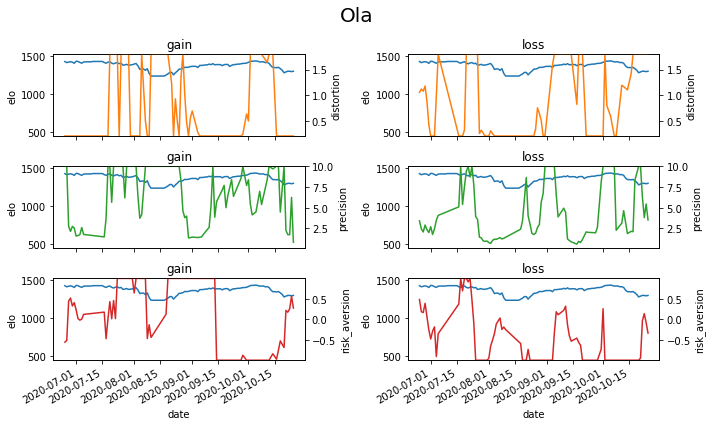

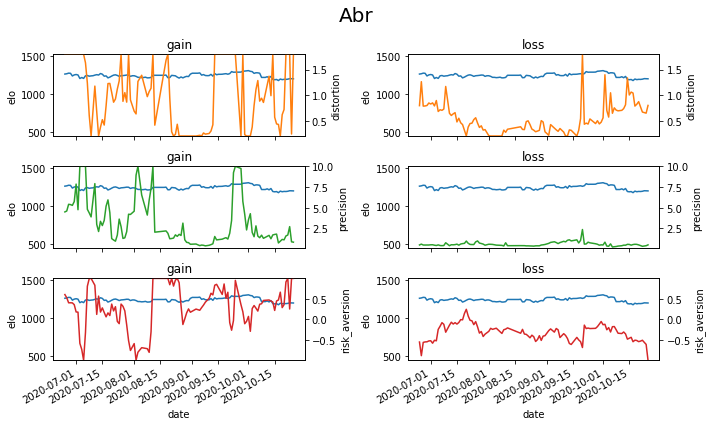

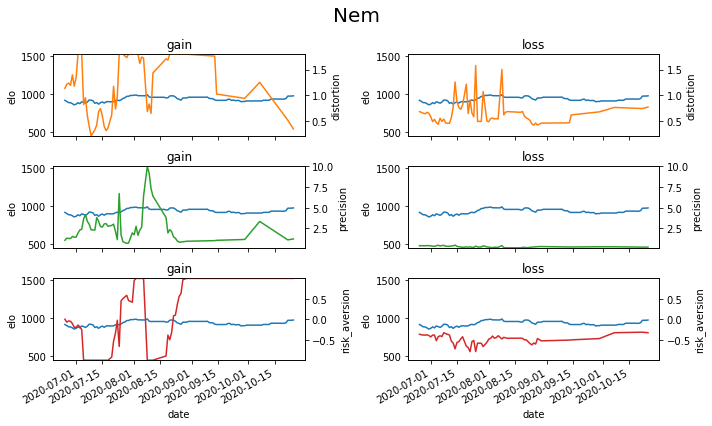

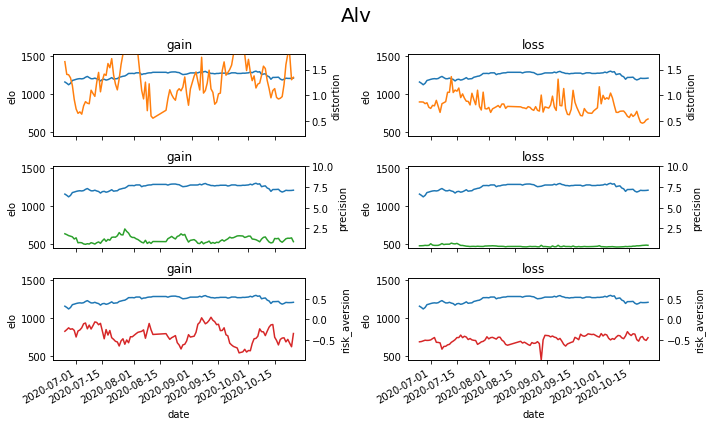

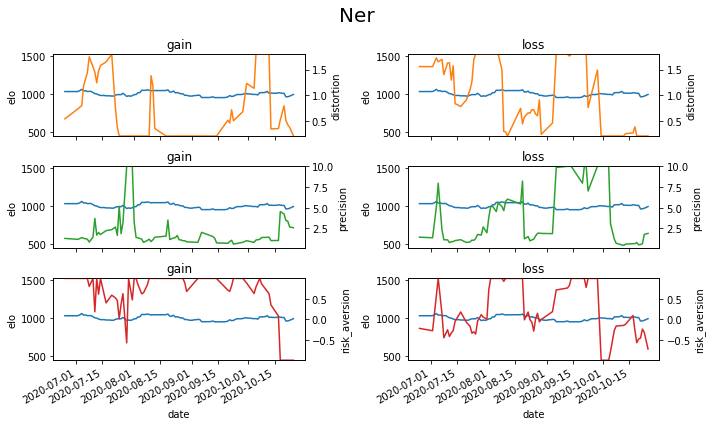

...

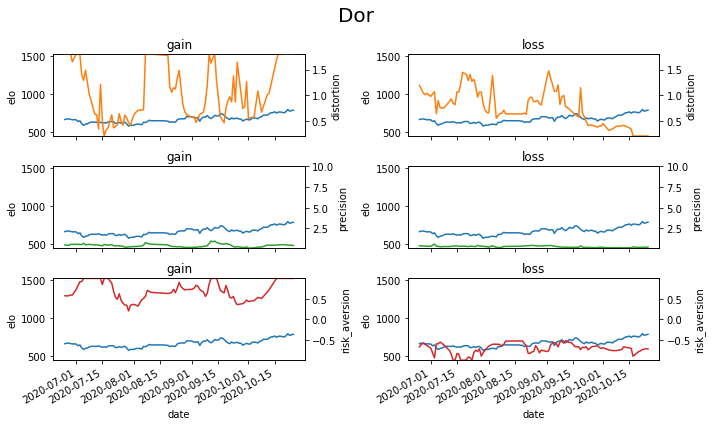

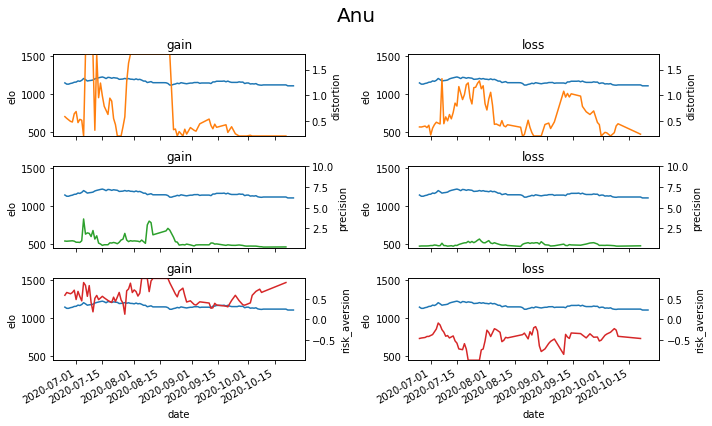

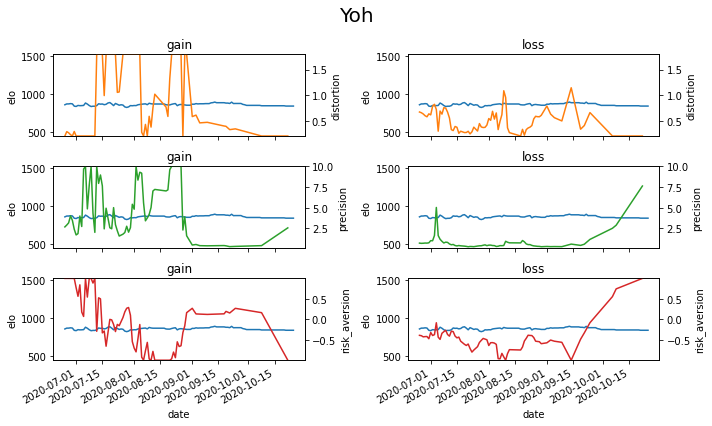

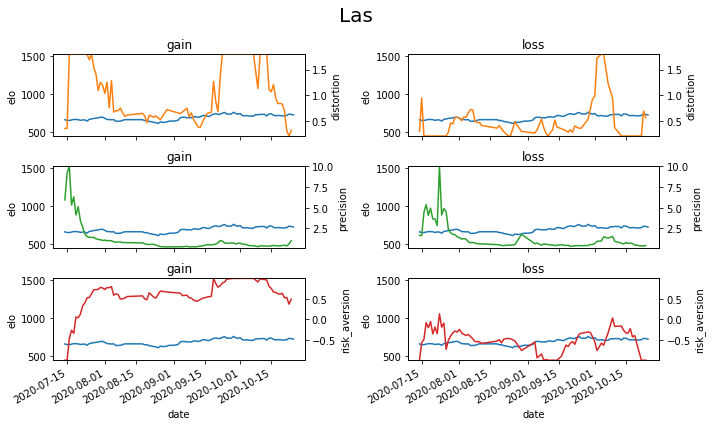

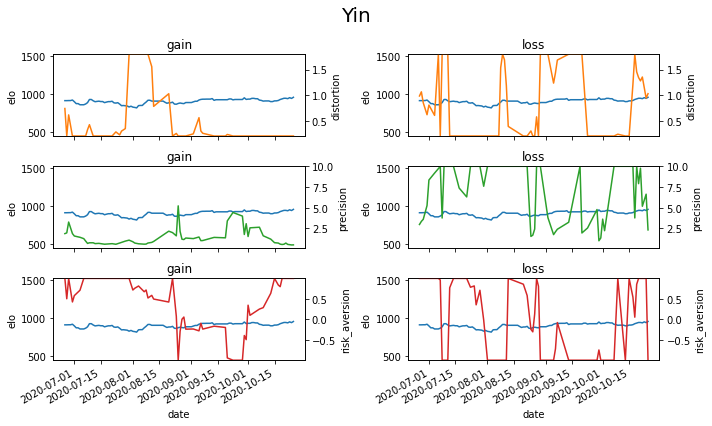

In [91]:
min_elo = np.min(np.min(df_elo))
max_elo = np.max(np.max(df_elo))

monkeys = df_fit.monkey.unique()
cond = ("gain", "loss")

for i, m in enumerate(monkeys):
    
    fig, axes = plt.subplots(figsize=(10, 2*n_param), nrows=n_param, ncols=len(cond))
    fig.suptitle(m, fontsize=20)
    colors = [f"C{k}" for k in range(1, n_param+1)]
    
    for j, cd in enumerate(cond):
        
        df_p = df_fit[(df_fit.monkey == m) & (df_fit.condition == cd)]
        
        df_elo_m = df_elo[m.lower()]
        df_elo_m = df_elo_m[df_elo_m.index >= min(df_p.date)]
        
        for k in range(n_param):

            ax = axes[k, j]
            ax.set_title(cd)
            param = Model.param_labels[k]
            lim_param = Model.fit_bounds[k]
            color = colors[k]

            sns.lineplot(data=df_elo_m, ax=ax)
            ax.set_ylabel("elo")
            ax.set_ylim(min_elo, max_elo)
            
            ax_tw = ax.twinx()
            ax_tw.set_ylim(lim_param)
            sns.lineplot(x="date", y=param, data=df_p, ax=ax_tw, color=color)
    
    fig.autofmt_xdate()
    
    plt.tight_layout()
    plt.show()

## Next steps

* Add third column, with number of trials for each point
* Regression analysis for each parameter / monkey / condition

# Regression

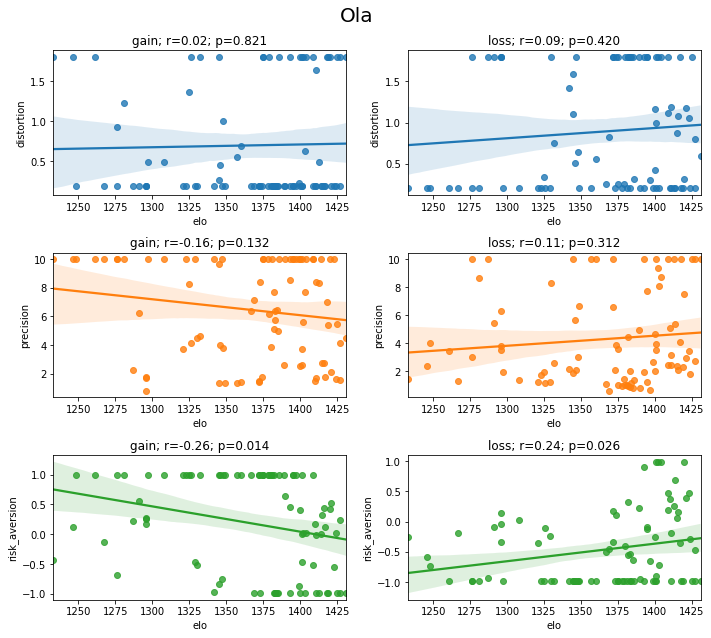

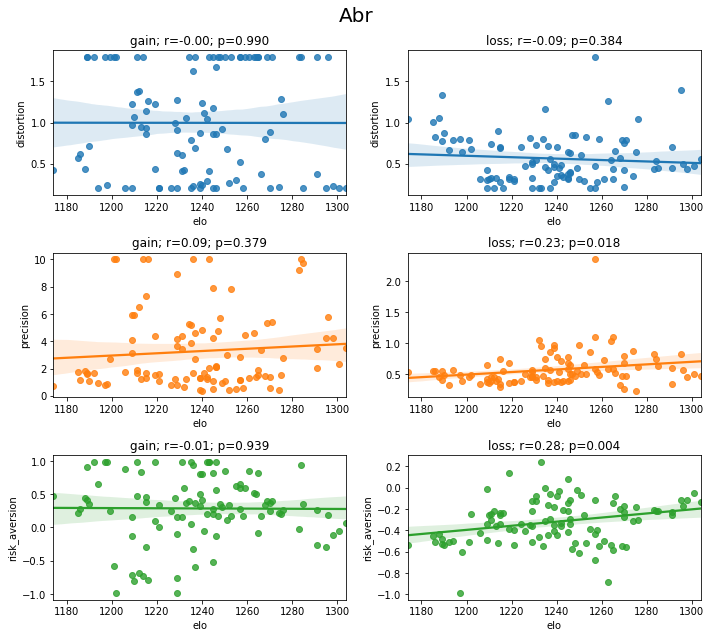

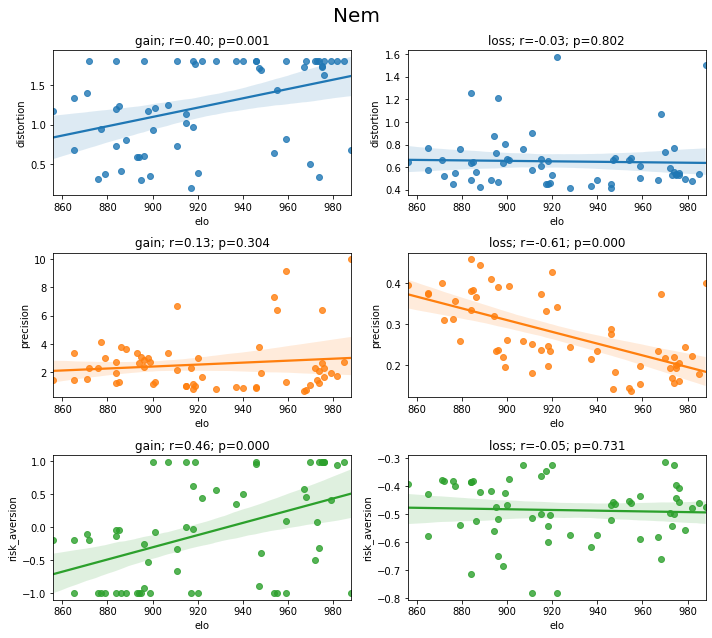

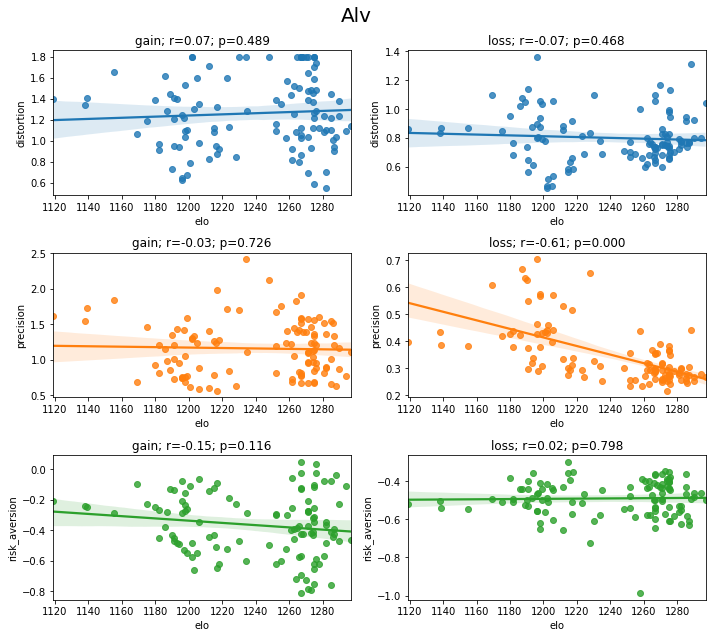

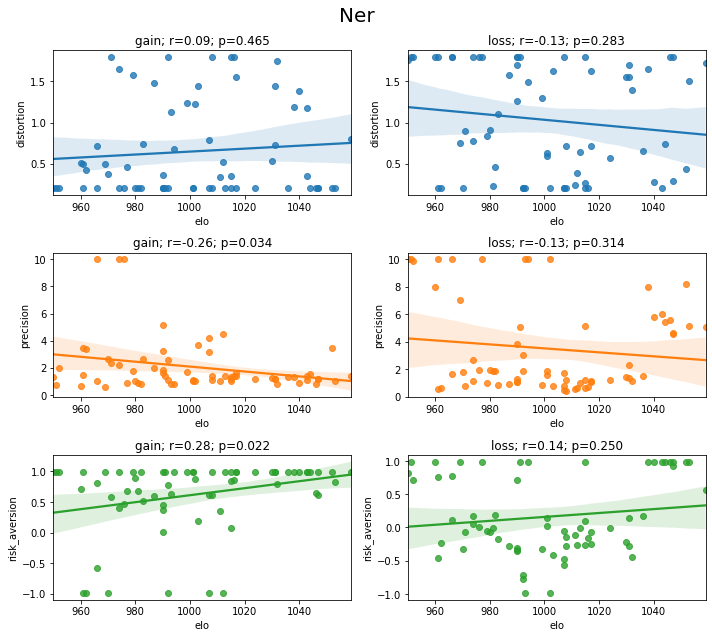

...

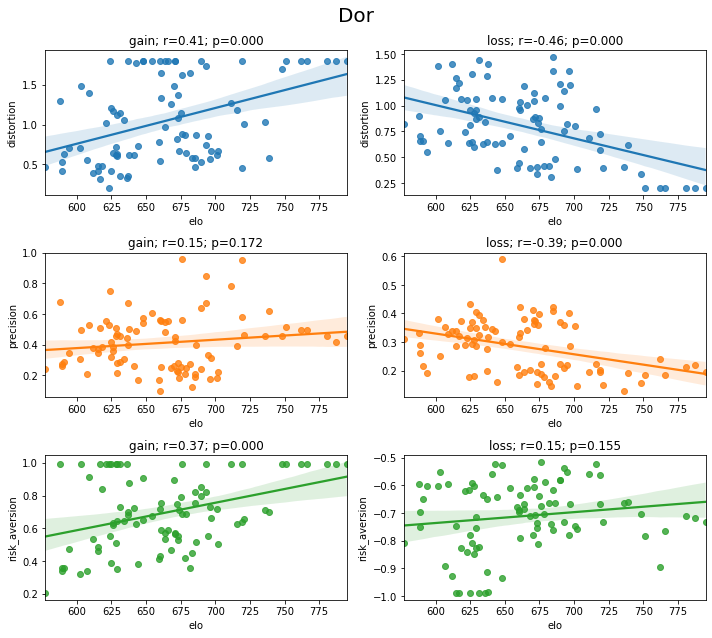

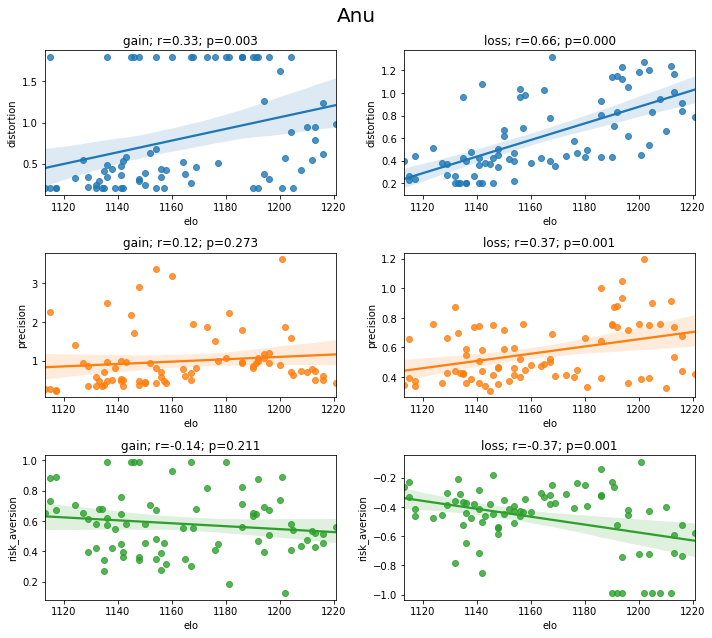

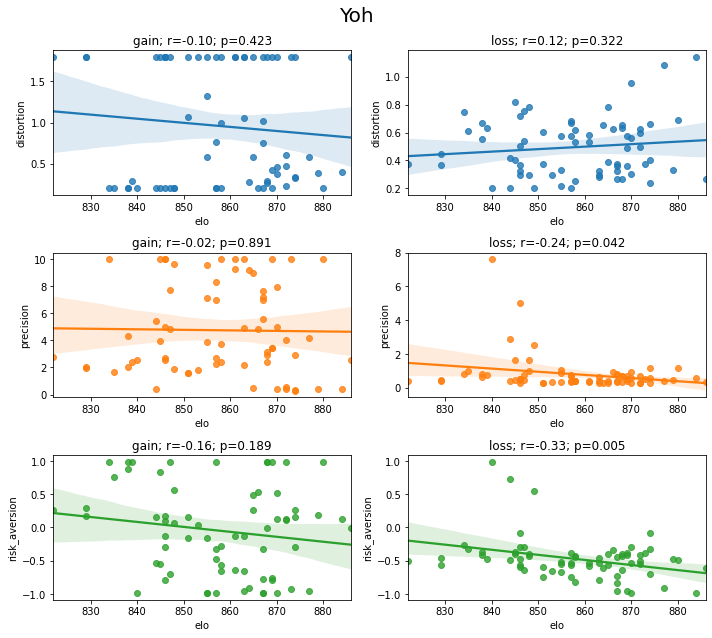

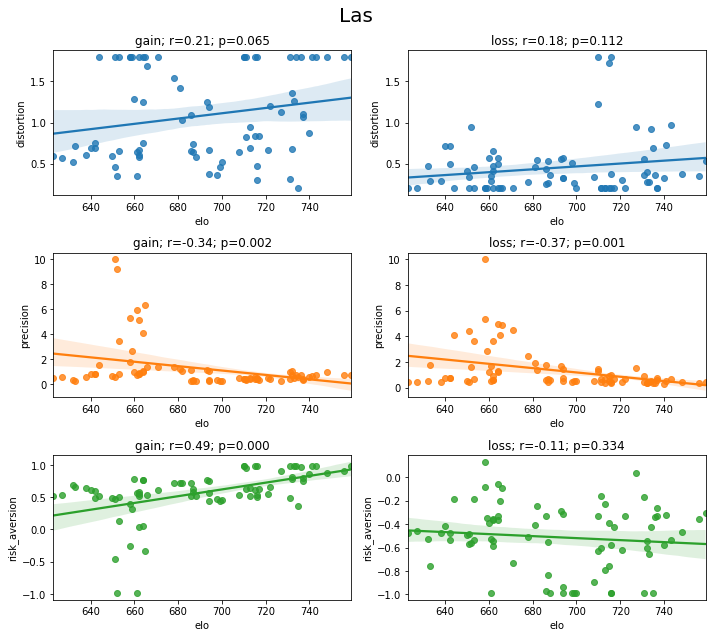

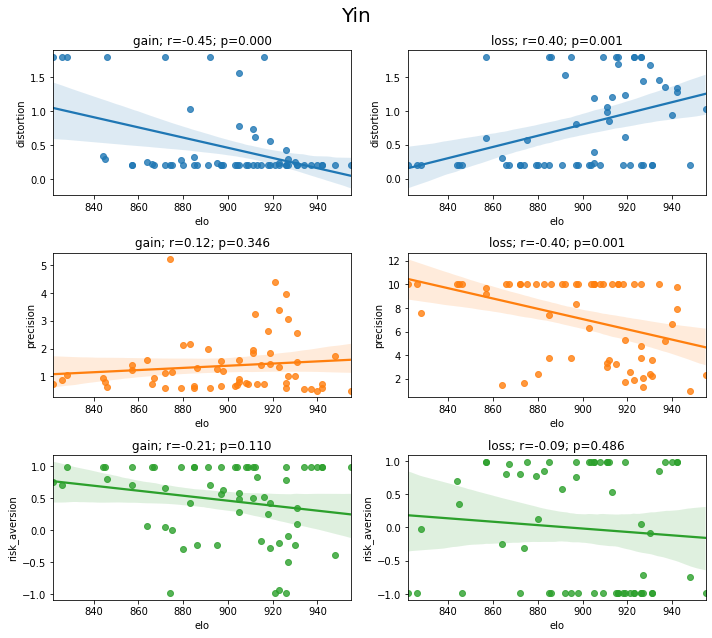

In [118]:
monkeys = df_fit.monkey.unique()
cond = ("gain", "loss")

for i, m in enumerate(monkeys):
    
    fig, axes = plt.subplots(figsize=(10, 3*n_param), nrows=n_param, ncols=len(cond))
    fig.suptitle(m, fontsize=20)
    
    for j, cd in enumerate(cond):
        
        df_p = df_fit[(df_fit.monkey == m) & (df_fit.condition == cd)]
        
        df_elo_m = df_elo[m.lower()]
        df_elo_m = df_elo_m[df_elo_m.index >= min(df_p.date)]
        
        for k in range(n_param):
            
            param = Model.param_labels[k]
            
            df_ = pd.DataFrame({
                param: df_p[param].values, 
                "elo": df_elo_m        
            }, index=df_p.date)
            
            r_, p = scipy.stats.pearsonr(df_.elo, df_[param].values)
            
            ax = axes[k, j]
            t = f"{cd}; r={r_:.2f}; p={p:.3f}"
            ax.set_title(t)
            
            sns.regplot(x="elo", y=param, data=df_, color=colors[k], ax=ax)
    
    plt.tight_layout()
    plt.show()

In [113]:
df_fit = pd.read_csv(os.path.join(BACKUP_FOLDER, "df_fit.csv"), index_col=0)
df_fit.date = pd.to_datetime(df_fit.date)
df_elo = pd.read_csv(os.path.join(BACKUP_FOLDER, "df_elo.csv"), index_col=0)
df_elo.index = pd.to_datetime(df_elo.index)
df_fit

,distortion,precision,risk_aversion,date,monkey,condition,n
0,0.200000,10.000000,-0.552074,2020-06-25,Ola,gain,130
1,0.200000,10.000000,-0.512254,2020-06-26,Ola,gain,142
2,0.200000,2.727403,0.439623,2020-06-27,Ola,gain,152
3,0.200000,2.122734,0.514584,2020-06-28,Ola,gain,160
4,0.200000,2.723621,0.321982,2020-06-29,Ola,gain,172
...,...,...,...,...,...,...,...
57,1.343875,7.899244,0.990000,2020-10-20,Yin,loss,48
58,1.278380,9.770808,0.990000,2020-10-21,Yin,loss,42
59,1.353748,5.161971,0.990000,2020-10-22,Yin,loss,36
60,0.940235,6.624522,0.990000,2020-10-24,Yin,loss,30


In [135]:
monkeys = df_fit.monkey.unique()
cond = df_fit.condition.unique()
param = Model.param_labels    

d = [] 

for i, m in enumerate(monkeys):
    
    for j, cd in enumerate(cond):
        
        df_p = df_fit[(df_fit.monkey == m) & (df_fit.condition == cd)]
        
        df_elo_m = df_elo[m.lower()]
        df_elo_m = df_elo_m[df_elo_m.index >= min(df_p.date)]
        
        for k, pr in enumerate(param):
  
            df_ = pd.DataFrame({
                pr: df_p[pr].values, 
                "elo": df_elo_m        
            }, index=df_p.date)
            
            r_, p = scipy.stats.pearsonr(df_.elo, df_[pr].values)
            
            d.append({"monkey": m, "condition": cd, "param": pr, "r": r_, "p": p})

df = pd.DataFrame(d)
            
for cd in cond:
    for pr in param:
        d = df[(df.param == pr) & (df.condition == cd)]
        sgn = d.p < 0.05
        pos = d[sgn].r > 0
        neg = d[sgn].r < 0
        print(f"{pr}-{cd}: {np.sum(sgn)} sign.; ({np.sum(pos)} +, {np.sum(neg)} -)")

distortion-gain: 6 sign.; (3 +, 3 -)
precision-gain: 5 sign.; (2 +, 3 -)
risk_aversion-gain: 7 sign.; (5 +, 2 -)
distortion-loss: 6 sign.; (4 +, 2 -)
precision-loss: 11 sign.; (3 +, 8 -)
risk_aversion-loss: 6 sign.; (2 +, 4 -)


# Parameter recovery

In [102]:
def generate_stimuli():
    possible_p = [0.25, 0.5, 0.75, 1]
    possible_x = np.arange(1, 4)
    p = sorted(np.random.choice(possible_p, size=2, replace=False))
    x = sorted(np.random.choice(possible_x, size=2, replace=False), reverse=True)
    return {"p0": p[0], "p1": p[1], "x0": x[0], "x1": x[1]}


def simulate(model, param, n_trial):
    m = Model(param=param)
    d = []
    for t in range(n_trial):
        stim = generate_stimuli()
        p = m.p(**stim)
        c = int(p[1] > np.random.random())
        d.append({"c": c, **stim})
    data = pd.DataFrame(d)
    return data

In [103]:
# Seed the pseudo-random number generator
np.random.seed(1284)

# Select one model
model = Model 

# Define the number of agents to simulate
n = 30 

for n_trial in 100, 500, 1000, 10000: 

    # Data container
    row_list = []

    # For each agent...
    for i in tqdm(range(n), file=sys.stdout):

        # Generate parameters to simualte
        param_to_sim = [np.random.uniform(*b)
                        for b in model.fit_bounds]

        # Simulate
        d = simulate(model=model, param=param_to_sim, n_trial=n_trial)

        # Optimize
        best_param, best_value = optimize(model=model, data=d)

        # Backup
        for j in range(len(param_to_sim)):
            row_list.append({
                "Parameter": model.param_labels[j],
                "Used to simulate": param_to_sim[j],
                "Recovered": best_param[j]})

    # Create dataframe and save it
    df = pd.DataFrame(row_list)
    df.to_csv(os.path.join(BACKUP_FOLDER, f"parameter_recovery_{n_trial}.csv"))

100%|██████████| 30/30 [33:07<00:00, 66.23s/it]


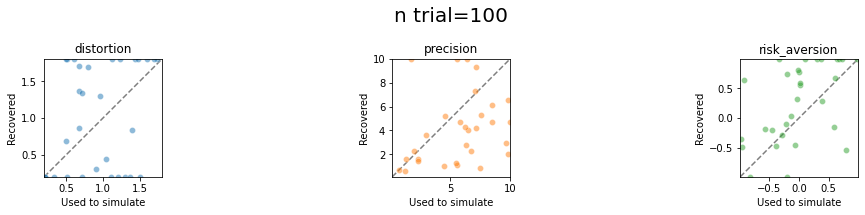

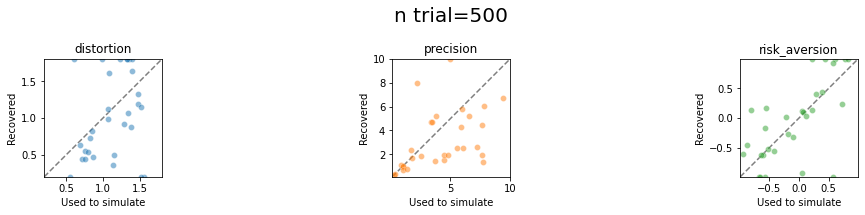

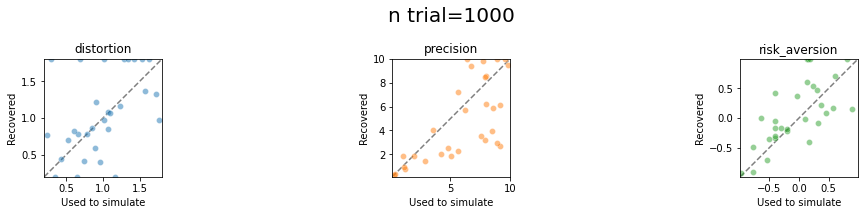

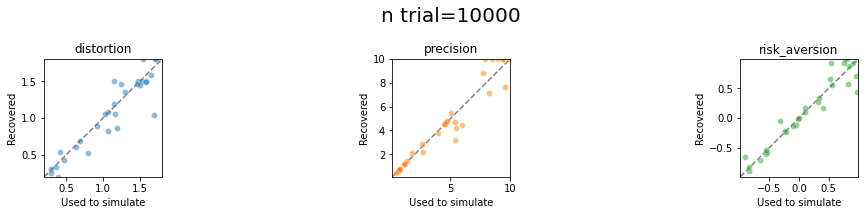

In [107]:
# Plot
param_names = Model.param_labels
param_bounds = Model.fit_bounds
n_param = len(param_names)

# Define colors
colors = [f'C{i}' for i in range(n_param)]

for n_trial in 100, 500, 1000, 10000:  
    
    # Load data
    df = pd.read_csv(os.path.join(BACKUP_FOLDER, f"parameter_recovery_{n_trial}.csv"), index_col=0)
    
    # Create fig and axes
    fig, axes = plt.subplots(ncols=n_param,
                             figsize=(5*n_param, 3))

    fig.suptitle(f"n trial={n_trial}", fontsize=20)
    
    for i in range(n_param):

        # Select ax
        ax = axes[i]

        # Get param name
        p_name = param_names[i]

        # Set title
        ax.set_title(p_name)

        # Create scatter
        sns.scatterplot(data=df[df["Parameter"] == p_name], 
                        x="Used to simulate", y="Recovered", 
                        alpha=0.5, color=colors[i], 
                        ax=ax)

        # Plot identity function
        ax.plot(param_bounds[i], param_bounds[i], 
                linestyle="--", alpha=0.5, color="black", zorder=-10)

        # Set axes limits
        ax.set_xlim(*param_bounds[i])
        ax.set_ylim(*param_bounds[i])

        # Square aspect
        ax.set_aspect(1)

    plt.tight_layout()
    plt.show()

# TODO

- Population analysis